In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer


In [2]:
import warnings
warnings.filterwarnings('ignore')

# Seperate Dataset creation for Control and Test Participants

We take all the control participant trial files and combine them to form a dataset

In [3]:
folder_path = 'C:/Users/Rupesh/Downloads/EyeT/EyeT'

# Get all files that match the criteria
matching_files_control = [f for f in os.listdir(folder_path) if 'dataset_II_' in f]

# Load the files into dataframes and concatenate
combined_data_control = pd.concat([pd.read_csv(os.path.join(folder_path, file_name)) for file_name in matching_files_control])

In [4]:
combined_data_control.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,667,4394847,2575955327,NaN,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,NaN,Unclassified,8.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN
1,668,4394847,2575955327,NaN,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,NaN,Unclassified,8.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN
2,669,4400762,2575961242,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN
3,670,4409117,2575969597,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN
4,671,4417439,2575977919,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN


We take all the test participant trial files and combine them to form a dataset

In [7]:
def load_large_file_in_chunks(file_path, chunk_size=50000):
    chunks = []
    for chunk in pd.read_csv(file_path, chunksize=chunk_size):
        chunks.append(chunk)
    return pd.concat(chunks, axis=0)


# Get all files that match the criteria
matching_files_test = [f for f in os.listdir(folder_path) if 'dataset_III_' in f]
combined_data_test = pd.concat([load_large_file_in_chunks(os.path.join(folder_path, file_name)) for file_name in matching_files_test])


In [8]:
combined_data_test.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,3082,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
1,3083,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
2,3084,23426120,512099191,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
3,3085,23434449,512107520,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
4,3086,23442782,512115853,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN


# Functions Used in both Control and Test Participants Modelling and Analysis

In [9]:
def compute_null_percentage(dataframe):
    """
    Computes the percentage of null values for each column in the dataframe.

    Parameters:
    - dataframe (pd.DataFrame): Input dataframe.

    Returns:
    - pd.DataFrame: A dataframe containing column names and their respective null percentages.
    """
    
    # Calculate the number of null values for each column
    null_counts = dataframe.isnull().sum()
    
    # Calculate the percentage of null values for each column
    null_ratio = null_counts / len(dataframe) * 100
    
    # Construct a dataframe to represent the results
    result_df = pd.DataFrame({
        'Column': null_ratio.index,
        'Percentage of Nulls': null_ratio.values
    })
    
    return result_df

In [10]:
def count_unique_recordings_by_participant(data):
    """
    Count the number of unique recordings for each participant in the dataset.

    Parameters:
    - data (DataFrame): The dataset containing participant names and their recordings.

    Returns:
    - Series: A series with participant names as the index and their respective counts of unique recordings as values.
    """
    
    # Group by the 'Participant name' column
    grouped_by_participant = data.groupby('Participant name')
    
    # Count unique 'Recording name' for each participant
    unique_recording_counts = grouped_by_participant['Recording name'].nunique()

    return unique_recording_counts


In [11]:
def str_to_float_conversion(data_frame, target_columns):
    """
    Convert specified columns in a dataframe from string to float.
    
    Parameters:
    - data_frame (pd.DataFrame): The input dataframe.
    - target_columns (list): List of column names to convert.
    
    Returns:
    - pd.DataFrame: Dataframe with specified columns converted to float.
    """
    for column in target_columns:
        data_frame[column] = data_frame[column].str.replace(',', '.').astype(float)
    return data_frame
    


In [12]:
def cleanedPredictionDataset(data_frame):
    """
    Preprocess the input dataset for predictions.
    
    Args:
        data_frame (pd.DataFrame): The input dataset.
        
    Returns:
        pd.DataFrame: The cleaned dataset.
    """

    # Columns of interest
    selected_columns = [
        "Participant name", "Recording timestamp", "Recording name", 
        "Eye movement type", "Pupil diameter left", "Pupil diameter right", 
        'Event'
    ]

    # Extract the required columns from the input data
    refined_data = data_frame[selected_columns]

    # Columns that need type conversion
    columns_for_conversion = ["Pupil diameter left", "Pupil diameter right"]

    # Perform the conversion on specified columns
    refined_data = str_to_float_conversion(refined_data, columns_for_conversion)
    
    return refined_data
    


In [13]:
def getImputedDataSet(df):
    """
    This function imputes missing data in the given dataframe.
    
    Parameters:
    - df: The input dataframe
    
    Returns:
    - df: The dataframe with imputed data
    """
    
    # Group data by 'Participant name' and 'Recording name'
    data_groups = df.groupby(['Participant name', 'Recording name'])
    
    # Fill missing values in 'Pupil diameter left' column using forward fill and then backward fill
    df['Pupil diameter left'] = data_groups['Pupil diameter left'].transform(
        lambda series: series.fillna(method='ffill').fillna(method='bfill')
    )
    
    # Fill missing values in 'Pupil diameter right' column using forward fill and then backward fill
    df['Pupil diameter right'] = data_groups['Pupil diameter right'].transform(
        lambda series: series.fillna(method='ffill').fillna(method='bfill')
    )
    
    # Fill missing values in 'Eye movement type' column with the value "EyesNotFound"
    df['Eye movement type'].fillna("EyesNotFound", inplace=True)
    
    return df

In [14]:

def plotParticipantPupilData(dataframe, participant_name):
    # Filter data for the specified participant
    participant_data = dataframe[dataframe['Participant name'] == participant_name]

    # Set the style of the visualization
    sns.set_style("whitegrid")

    # Create a joint plot with scatter and histograms
    joint = sns.jointplot(x="Pupil diameter left", y="Pupil diameter right", data=participant_data, kind="reg", height=8, space=0.5, scatter_kws={'s':10, 'alpha':0.5}, color='blue')
    
    # Set titles and labels
    joint.set_axis_labels("Pupil Diameter Left", "Pupil Diameter Right", fontsize=12)
    joint.fig.suptitle(f"Scatter Plot of Pupil Diameter Left vs. Right for {participant_name}", fontsize=15, y=1.03)

    plt.show()



In [15]:
def plotEyeMovementData(dataframe):
    # Set the style of the visualization
    sns.set_style("whitegrid")

    # Group the data by 'Eye movement type'
    data_grouped_by_eye_movement = dataframe.groupby('Eye movement type')

    # Define a color map for each eye movement type
    color_mapping = {
        'Fixation': 'yellow',
        'Saccade': 'green',
        'Unclassified': 'red',
        'EyesNotFound': 'purple'
    }

    # Create a scatter plot and histograms of the 'Pupil diameter left' and 'Pupil diameter right' columns for each eye movement type
    for movement_type, movement_data in data_grouped_by_eye_movement:
        g = sns.jointplot(x='Pupil diameter left', y='Pupil diameter right', data=movement_data, kind="scatter", color=color_mapping[movement_type], height=8, marginal_kws=dict(bins=30, fill=True))
        
        g.set_axis_labels('Pupil Diameter Left', 'Pupil Diameter Right', fontsize=12)
        g.fig.suptitle(f'Pupil Diameter: {movement_type}', fontsize=15, y=1.03)
        plt.show()

In [16]:
def calculate_eye_metrics(data_group):
    """
    Calculate eye metrics based on the provided group of data.
    
    Args:
        data_group (DataFrame): Grouped data containing eye metrics, timestamps, and events.
    
    Returns:
        DataFrame: Computed metrics.
    """
    # Initialize an empty list to store the results
    aggregated_results = []
    
    # Number of unique recordings in the group
    num_recordings = data_group['Recording name'].nunique()
    
    for idx in range(num_recordings):
        # Extract timestamps corresponding to the start and end of the image stimulus presentation
        start_time = data_group.loc[data_group['Event'] == 'ImageStimulusStart', 'Recording timestamp'].values[idx]
        end_time = data_group.loc[data_group['Event'] == 'ImageStimulusEnd', 'Recording timestamp'].values[idx]
        
        # Display the data in a tabulated form
        table_header = "| Participant Name | Start Timestamp | End Timestamp |"
        table_separator = "|------------------|-----------------|---------------|"
        table_row = f"| {data_group['Participant name'].iloc[0]} | {start_time} | {end_time} |"

        print(table_header)
        print(table_separator)
        print(table_row)

        # Filter the data for the given start and end timestamps
        filtered_data =data_group.query('`Recording timestamp` >= @start_time and `Recording timestamp` < @end_time')
        
        # Compute total fixation time and saccade time
        total_fixation_time = filtered_data[filtered_data['Eye movement type'] == 'Fixation']['Recording timestamp'].diff().sum()
        total_saccade_time = filtered_data[filtered_data['Eye movement type'] == 'Saccade']['Recording timestamp'].diff().sum()       

        # Compute mean pupil diameters for left and right eyes
        avg_left_pupil = filtered_data['Pupil diameter left'].mean()
        avg_right_pupil = filtered_data['Pupil diameter right'].mean()
       
        # Create an empty dictionary to store computed metrics for the current group
        participant_metrics = {}

        # Populate the metrics
        participant_metrics['Participant'] = data_group['Participant name'].iloc[0]
        participant_metrics['Trial'] = idx + 1
        participant_metrics['Average Left Pupil Diameter'] = avg_left_pupil
        participant_metrics['Average Right Pupil Diameter'] = avg_right_pupil
        participant_metrics['Total Fixation Duration'] = total_fixation_time
        participant_metrics['Total Saccade Duration'] = total_saccade_time

        # Append the populated dictionary to the results list
        aggregated_results.append(participant_metrics)

    # Convert the results list to a DataFrame and return
    return pd.DataFrame(aggregated_results)


In [17]:
def plot_pupil_diameter(participant_data, participant_name):
    """Function to plot mean pupil diameter (left and right) over trials for a specific participant."""
    
    # Set Seaborn style
    sns.set_style("whitegrid")
    sns.set_palette("pastel")
    
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot data with Seaborn for better aesthetics
    sns.lineplot(x=participant_data['Trial'], y=participant_data['Average Left Pupil Diameter'], label='Left', linestyle='-', linewidth=2.5, marker='o', ax=ax)
    sns.lineplot(x=participant_data['Trial'], y=participant_data['Average Right Pupil Diameter'], label='Right', linestyle='--', linewidth=2.5, marker='s', ax=ax)
    
    # Setting labels, title, and legend
    ax.set_xlabel('Trial', fontsize=14)
    ax.set_ylabel('Mean Pupil Diameter (Left & Right)', fontsize=14)
    ax.set_title(f'Mean Pupil Diameter (Left & Right) of Participant {participant_name} over trials', fontsize=16)
    ax.legend(fontsize=12)
    
    plt.tight_layout()
    plt.show()


In [18]:
def plot_fixation_saccade_durations(participant_data, participant_name):
    """Function to plot total fixation duration and total saccade duration over trials for a specific participant."""
    
    # Set Seaborn style
    sns.set_style("whitegrid")
    sns.set_palette("pastel")
    
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot data with Seaborn
    sns.lineplot(x=participant_data['Trial'], y=participant_data['Total Fixation Duration'], label='Fixation Duration', linestyle='-', linewidth=2.5, marker='o', ax=ax)
    sns.lineplot(x=participant_data['Trial'], y=participant_data['Total Saccade Duration'], label='Saccade Duration', linestyle='--', linewidth=2.5, marker='s', ax=ax)
    
    # Setting labels, title, and legend
    ax.set_xlabel('Trial', fontsize=14)
    ax.set_ylabel('Duration (Fixation & Saccade)', fontsize=14)
    ax.set_title(f'Fixation and Saccade Durations of Participant {participant_name} over trials', fontsize=16)
    ax.legend(fontsize=12)
    
    plt.tight_layout()
    plt.show()

In [19]:
def standardize_columns(dataframe, columns):
    
    # 1. Extract these variables from the dataframe
    data_to_standardize = dataframe[columns]
    
    # 2. Use StandardScaler to standardize them
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(data_to_standardize)
    
    # Create a new dataframe using the standardized data
    standardized_dataframe = pd.DataFrame(standardized_data, columns=columns)
    
    return standardized_dataframe

In [20]:
def load_questionnaire(file_name):
    """Load specific columns from a questionnaire CSV file."""
    return pd.read_csv(file_name, encoding='ISO-8859-1', dtype={'Participant nr': str})


In [21]:
def split_data_using_groups(dataframe):
    
    # Define groups based on the 'Participant' column
    groups = dataframe['Participant']

    # Initialize GroupShuffleSplit
    gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    # Get train and test indices
    train_idx, test_idx = next(gss.split(dataframe, groups=groups))

    # Split the data using the obtained indices
    train_data = dataframe.iloc[train_idx]
    test_data = dataframe.iloc[test_idx]
    
    # Columns to drop for feature extraction
    columns_to_drop = ['Average Score', 'Participant', 'Trial']
    
    # Extracting features and target for training data
    X_train = train_data.drop(columns_to_drop, axis=1)
    y_train = train_data['Average Score']

    # Extracting features and target for test data
    X_test = test_data.drop(columns_to_drop, axis=1)
    y_test = test_data['Average Score']
    
    return X_train, y_train, X_test, y_test

In [22]:
def apply_lasso_cv(X_train, y_train, X_test, y_test):
    
    # Applying LassoCV
    lasso_cv = LassoCV(cv=5, random_state=0)
    lasso_cv.fit(X_train, y_train)

    # Predicting on test data
    y_pred = lasso_cv.predict(X_test)

    # Calculating RMSE and R^2 score
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)

    
    return rmse, r2

In [23]:
def group_cross_val_scores(model, X, y, groups):
    
    # Re-define the custom scorer for RMSE
    def rmse_scorer(true, pred):
        return mean_squared_error(true, pred, squared=False)

    # Initialize GroupShuffleSplit
    gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

    # Perform group-based cross-validation using GroupShuffleSplit and get R^2 scores
    r2_scores_gss = cross_val_score(model, X, y, cv=gss, scoring='r2', groups=groups)

    # Perform group-based cross-validation using GroupShuffleSplit and get RMSE scores using custom scorer
    rmse_scores_gss = cross_val_score(model, X, y, cv=gss, scoring=make_scorer(rmse_scorer), groups=groups)

    # Calculate mean R^2 and RMSE across all splits
    mean_r2_gss_optimized = r2_scores_gss.mean()
    mean_rmse_gss_optimized = rmse_scores_gss.mean()
    
    return mean_r2_gss_optimized, mean_rmse_gss_optimized

# Lets Explore the Control participants

In [24]:
print(combined_data_control.columns)

Index(['Unnamed: 0', 'Recording timestamp', 'Computer timestamp', 'Sensor',
       'Project name', 'Export date', 'Participant name', 'Recording name',
       'Recording date', 'Recording date UTC', 'Recording start time',
       'Recording start time UTC', 'Recording duration', 'Timeline name',
       'Recording Fixation filter name', 'Recording software version',
       'Recording resolution height', 'Recording resolution width',
       'Recording monitor latency', 'Eyetracker timestamp', 'Event',
       'Event value', 'Gaze point X', 'Gaze point Y', 'Gaze point left X',
       'Gaze point left Y', 'Gaze point right X', 'Gaze point right Y',
       'Gaze direction left X', 'Gaze direction left Y',
       'Gaze direction left Z', 'Gaze direction right X',
       'Gaze direction right Y', 'Gaze direction right Z',
       'Pupil diameter left', 'Pupil diameter right', 'Validity left',
       'Validity right', 'Eye position left X (DACSmm)',
       'Eye position left Y (DACSmm)', 'Eye po

In [25]:
combined_data_control.describe()

,Unnamed: 0,Recording timestamp,Computer timestamp,Recording duration,Recording resolution height,Recording resolution width,Eyetracker timestamp,Gaze point X,Gaze point Y,Gaze point left X,...,Presented Media position X (DACSpx),Presented Media position Y (DACSpx),Original Media width,Original Media height,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Mouse position X,Mouse position Y
count,1.067562e+06,1.067562e+06,1.067562e+06,1.067562e+06,1067562.0,1067562.0,1.053482e+06,923869.000000,923869.000000,850265.000000,...,1.066019e+06,1.066019e+06,1.066019e+06,1.066019e+06,1.067443e+06,1.067443e+06,614105.000000,614105.000000,12944.000000,12944.000000
mean,2.997951e+04,4.602736e+07,8.496068e+11,8.437401e+04,1080.0,1920.0,4.790488e+09,921.878953,403.849528,851.071529,...,1.596847e+02,-4.923591e+01,1.020844e+03,7.761430e+02,3.151868e+02,2.499771e+02,924.336182,412.979041,-444.255562,807.640837
std,2.993660e+04,3.656781e+07,1.071069e+12,4.901963e+04,0.0,0.0,1.311761e+10,305.423249,261.022742,311.748179,...,2.266453e+02,2.346986e+02,7.130553e+02,6.807999e+02,6.838592e+02,3.287934e+02,290.801577,255.075658,330.734211,255.402245
min,3.470000e+02,2.414233e+06,5.979128e+08,1.412400e+04,1080.0,1920.0,1.945353e+08,-351.000000,-216.000000,-363.000000,...,-7.470000e+02,-1.168000e+03,6.400000e+02,4.160000e+02,8.000000e+00,1.000000e+00,-23.000000,-212.000000,-1698.000000,-80.000000
25%,1.127700e+04,2.286439e+07,2.747467e+11,6.437800e+04,1080.0,1920.0,1.016466e+09,747.000000,223.000000,664.000000,...,1.290000e+02,0.000000e+00,6.400000e+02,4.160000e+02,3.300000e+01,6.900000e+01,759.000000,236.000000,-496.000000,681.000000
50%,2.152650e+04,4.003967e+07,5.156502e+11,6.646500e+04,1080.0,1920.0,1.934988e+09,927.000000,381.000000,852.000000,...,1.290000e+02,0.000000e+00,7.980000e+02,6.920000e+02,1.580000e+02,1.320000e+02,928.000000,385.000000,-426.000000,894.000000
75%,3.146400e+04,5.694918e+07,6.206466e+11,7.332400e+04,1080.0,1920.0,3.157870e+09,1084.000000,569.000000,1021.000000,...,3.370000e+02,0.000000e+00,7.980000e+02,6.920000e+02,3.500000e+02,2.780000e+02,1075.000000,572.000000,-344.000000,981.000000
max,1.505360e+05,2.282859e+08,4.059247e+12,2.284450e+05,1080.0,1920.0,7.900316e+10,2302.000000,2371.000000,2302.000000,...,4.200000e+02,0.000000e+00,3.415000e+03,3.415000e+03,1.215600e+04,2.656000e+03,2287.000000,1330.000000,1081.000000,1253.000000


In [26]:
null_percentage_df = compute_null_percentage(combined_data_control)
null_percentage_df

,Column,Percentage of Nulls
0,Unnamed: 0,0.000000
1,Recording timestamp,0.000000
2,Computer timestamp,0.000000
3,Sensor,0.106411
4,Project name,0.000000
...,...,...
66,Fixation point Y,42.475941
67,Fixation point X (MCSnorm),45.554544
68,Fixation point Y (MCSnorm),45.554544
69,Mouse position X,98.787518


In [27]:
combined_data_control.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,667,4394847,2575955327,NaN,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,NaN,Unclassified,8.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN
1,668,4394847,2575955327,NaN,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,NaN,Unclassified,8.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN
2,669,4400762,2575961242,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN
3,670,4409117,2575969597,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN
4,671,4417439,2575977919,Eye Tracker,Participant10,29.10.2020,Participant0010,Recording1,29.10.2020,29.10.2020,...,416.0,Saccade,25.0,16.0,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
participant_counts_control = count_unique_recordings_by_participant(combined_data_control)

Lets see how many trials each participant did in control group

In [29]:
# Convert the series to a DataFrame
participant_counts_table = participant_counts_control.reset_index()
participant_counts_table.columns = ['Participant Name', 'Unique Recording Count']

# Display the table
print(participant_counts_table)


   Participant Name  Unique Recording Count
0   Participant0002                       4
1   Participant0004                       4
2   Participant0006                       4
3   Participant0008                       4
4   Participant0010                       4
5   Participant0012                       4
6   Participant0014                       4
7   Participant0016                       4
8   Participant0018                       4
9   Participant0020                       4
10  Participant0022                       4
11  Participant0024                       4
12  Participant0026                       3
13  Participant0028                       4
14  Participant0030                       4
15  Participant0032                       3
16  Participant0034                       4
17  Participant0036                       4
18  Participant0038                       4
19  Participant0040                       4
20  Participant0042                       4
21  Participant0044             

Lets see how many eye movement Types are there and there respective counts

In [30]:
eye_movement_counts =combined_data_control['Eye movement type'].value_counts()
# Convert the Series to a DataFrame for table display
eye_movement_table = eye_movement_counts.reset_index()
eye_movement_table.columns = ['Eye Movement Type', 'Count']

eye_movement_table

,Eye Movement Type,Count
0,Fixation,614105
1,Saccade,169433
2,Unclassified,157085
3,EyesNotFound,126820


Clean the Control dataset

In [31]:
prediction_control_df =cleanedPredictionDataset(combined_data_control)


In [32]:
null_percentage_df = compute_null_percentage(prediction_control_df)
null_percentage_df

,Column,Percentage of Nulls
0,Participant name,0.000000
1,Recording timestamp,0.000000
2,Recording name,0.000000
3,Eye movement type,0.011147
4,Pupil diameter left,74.966981
5,Pupil diameter right,76.045326
6,Event,99.893589


Apply Imputation for the columns - Pupil diameter left, Pupil diameter right and Eye movement type

In [33]:

# Apply the  imputation function
prediction_control_df_interpolated = getImputedDataSet(prediction_control_df.copy())


# Reset index after groupby operation
prediction_control_df_interpolated.reset_index(drop=True, inplace=True)


# Display the first few rows of the interpolated dataframe
prediction_control_df_interpolated.head(20)

,Participant name,Recording timestamp,Recording name,Eye movement type,Pupil diameter left,Pupil diameter right,Event
0,Participant0010,4394847,Recording1,Unclassified,3.93,3.84,Eye tracker Calibration end
1,Participant0010,4394847,Recording1,Unclassified,3.93,3.84,ImageStimulusStart
2,Participant0010,4400762,Recording1,Saccade,3.93,3.84,NaN
3,Participant0010,4409117,Recording1,Saccade,3.93,3.84,NaN
4,Participant0010,4417439,Recording1,Saccade,3.93,3.84,NaN
5,Participant0010,4425765,Recording1,Unclassified,3.93,3.84,NaN
6,Participant0010,4434123,Recording1,Saccade,3.93,3.84,NaN
7,Participant0010,4442481,Recording1,Saccade,3.88,3.84,NaN
8,Participant0010,4450780,Recording1,Fixation,3.88,3.84,NaN
9,Participant0010,4459148,Recording1,Fixation,3.88,3.84,NaN


In [34]:
null_percentage_df = compute_null_percentage(prediction_control_df_interpolated)
null_percentage_df

,Column,Percentage of Nulls
0,Participant name,0.000000
1,Recording timestamp,0.000000
2,Recording name,0.000000
3,Eye movement type,0.000000
4,Pupil diameter left,0.000000
5,Pupil diameter right,0.000000
6,Event,99.893589


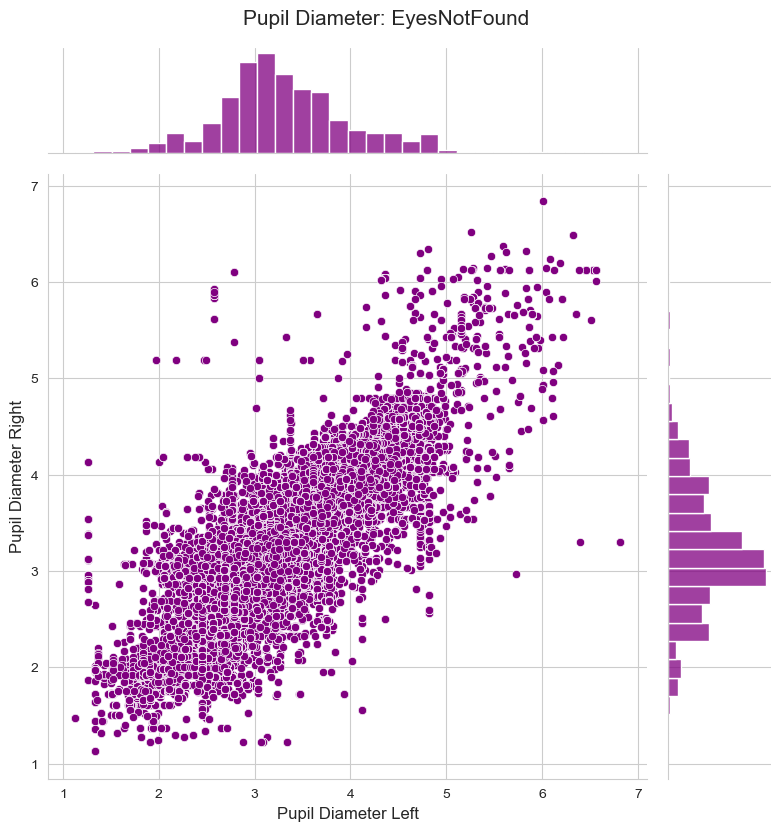

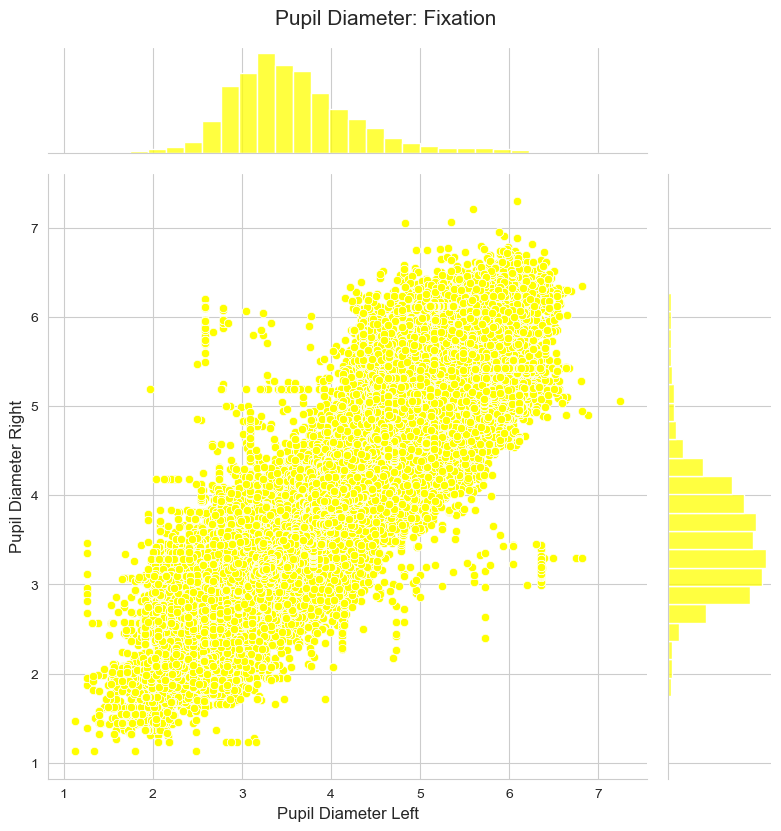

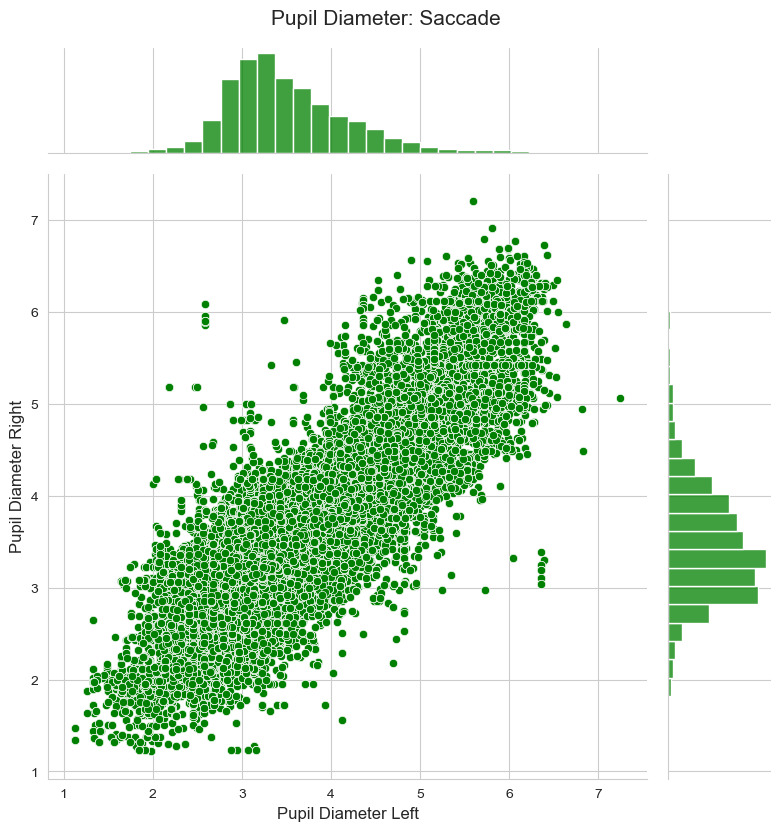

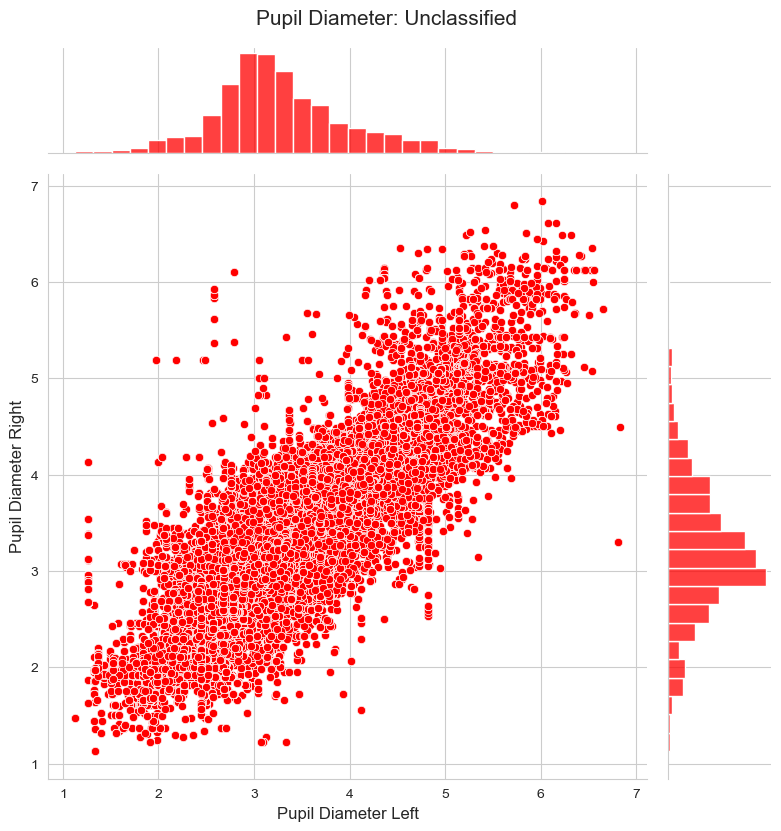

In [35]:
plotEyeMovementData(prediction_control_df_interpolated)

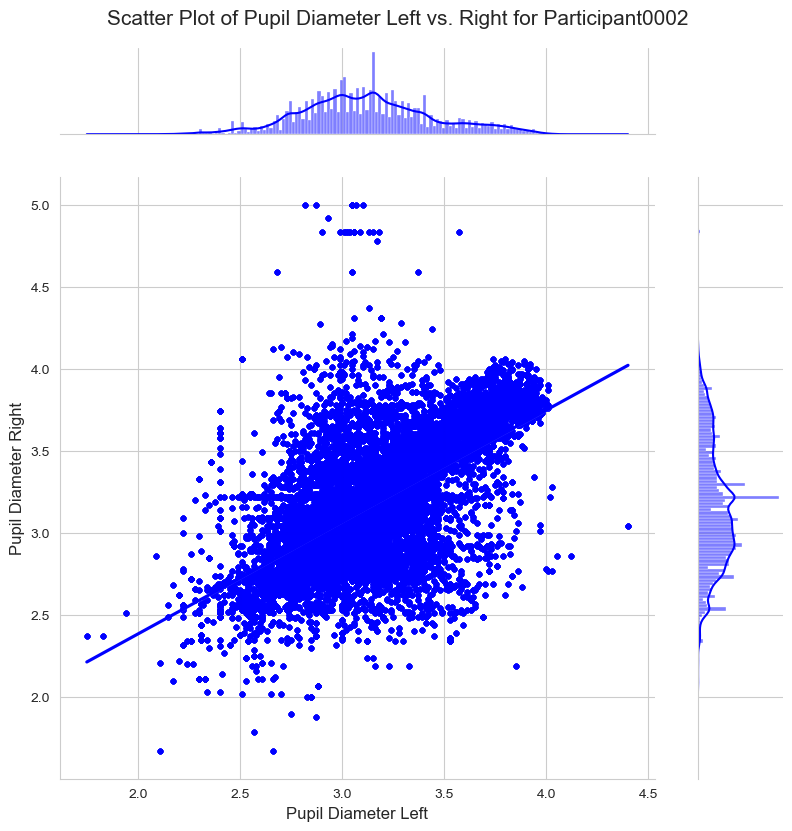

In [36]:
plotParticipantPupilData(prediction_control_df_interpolated, "Participant0002")

In [37]:
# Group the dataframe by 'Participant name'
grouped_by_participant = prediction_control_df_interpolated.groupby('Participant name')

# Apply the 'calculate_eye_metrics' function to each group
participant_results = grouped_by_participant.apply(calculate_eye_metrics)

# Reset the index for the final result
control_results_refactored = participant_results.reset_index(drop=True)

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0002 | 48551458 | 103049953 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0002 | 103049953 | 104049936 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0002 | 104049936 | 105049899 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0002 | 105049899 | 106066486 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0004 | 19046687 | 70328738 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0004 | 9854613 | 10837905 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-------

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0036 | 5443555 | 65142934 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0036 | 5500295 | 65516208 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0036 | 3700747 | 61549977 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0036 | 4136465 | 64152601 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0038 | 4608215 | 64607303 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0038 | 4950722 | 64950408 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|-

In [38]:
control_results_refactored.head(5)

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,Participant0002,1,2.997752,3.002061,54488678.0,54484989.0
1,Participant0002,2,3.151777,3.242810,994717.0,758446.0
2,Participant0002,3,3.107645,3.085188,950128.0,927993.0
3,Participant0002,4,3.088498,3.054872,1011345.0,575208.0
4,Participant0004,1,3.138972,3.015795,45856328.0,46681404.0


In [39]:
control_results_refactored['Participant'] = control_results_refactored['Participant'].str.replace(r'Participant0*', '', regex=True)

In [40]:
control_results_refactored.head()

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,2,1,2.997752,3.002061,54488678.0,54484989.0
1,2,2,3.151777,3.242810,994717.0,758446.0
2,2,3,3.107645,3.085188,950128.0,927993.0
3,2,4,3.088498,3.054872,1011345.0,575208.0
4,4,1,3.138972,3.015795,45856328.0,46681404.0


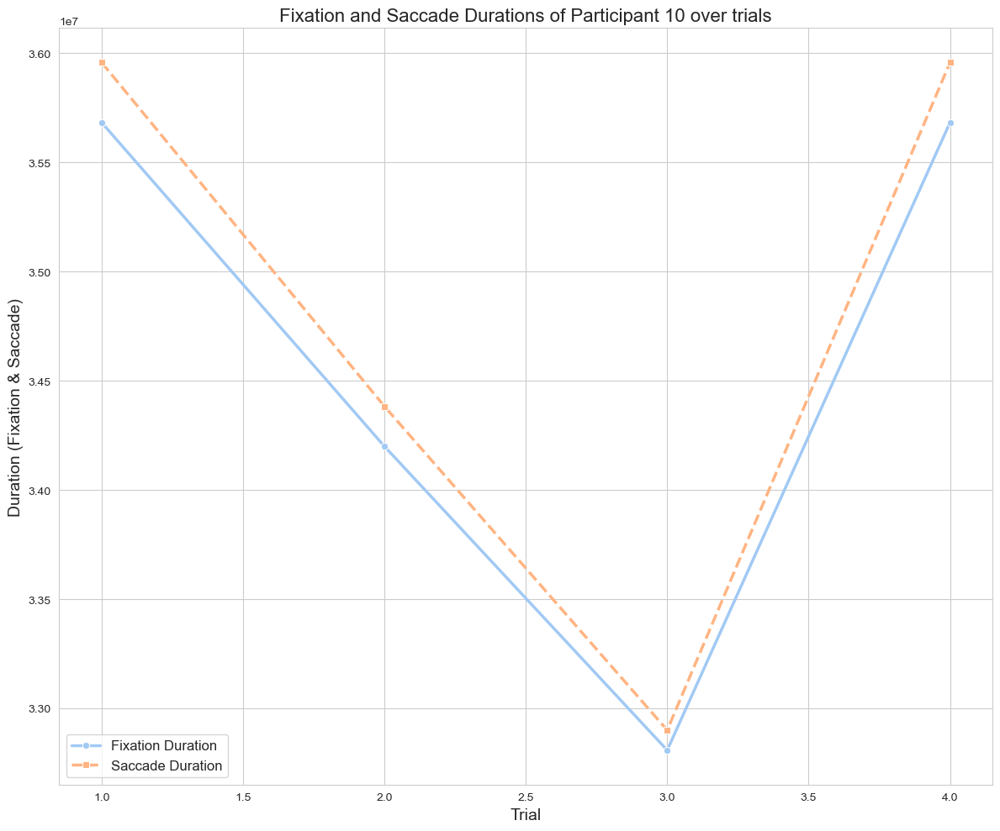

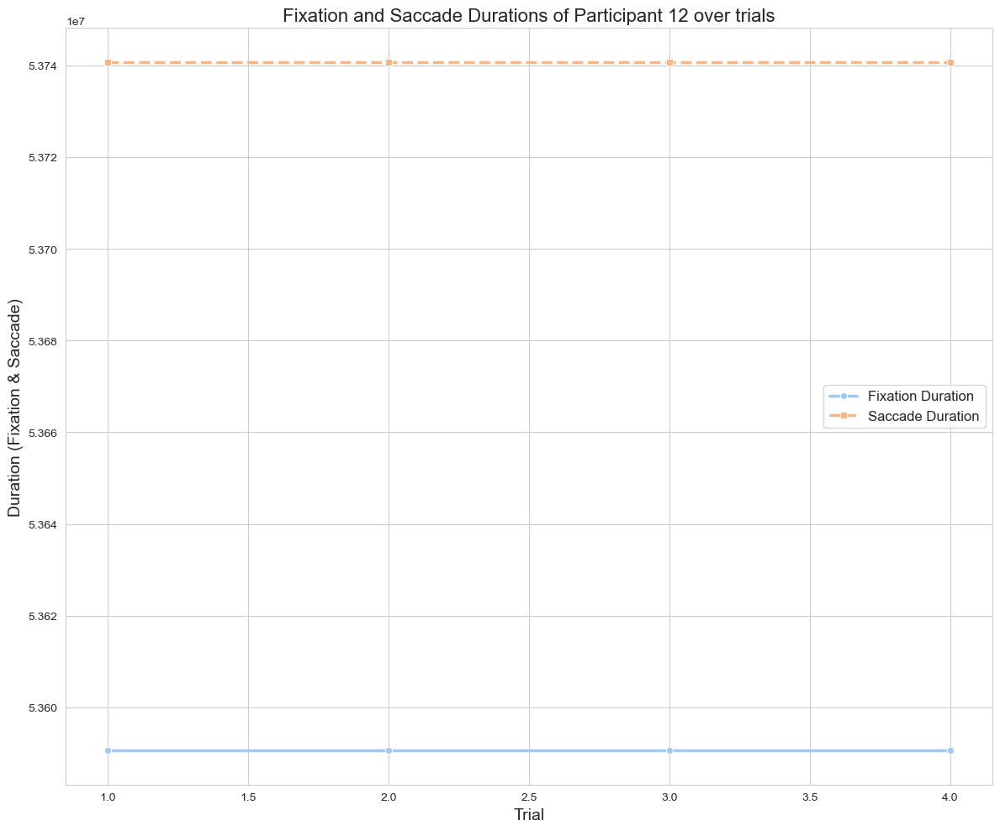

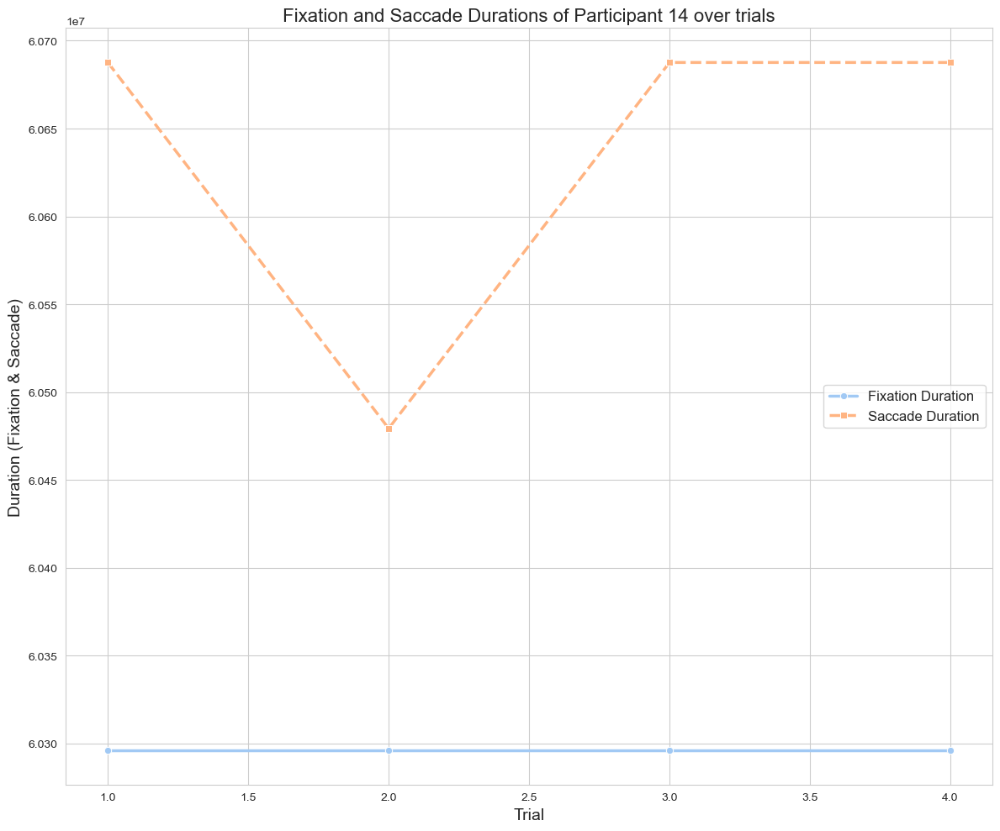

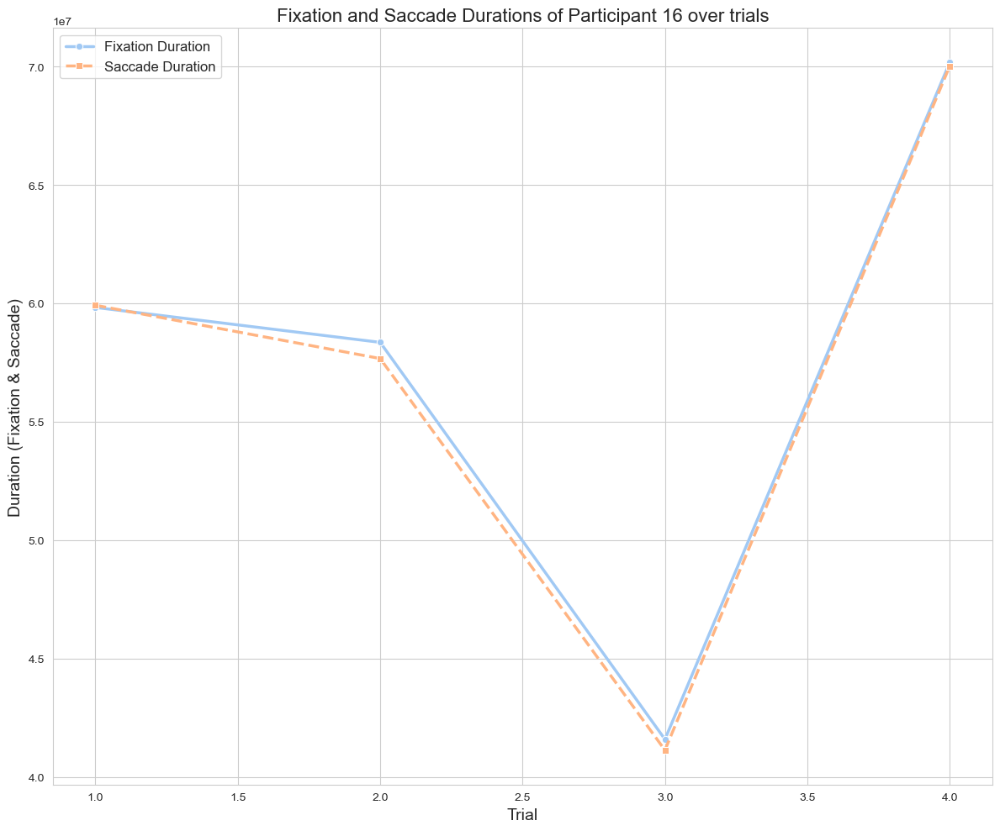

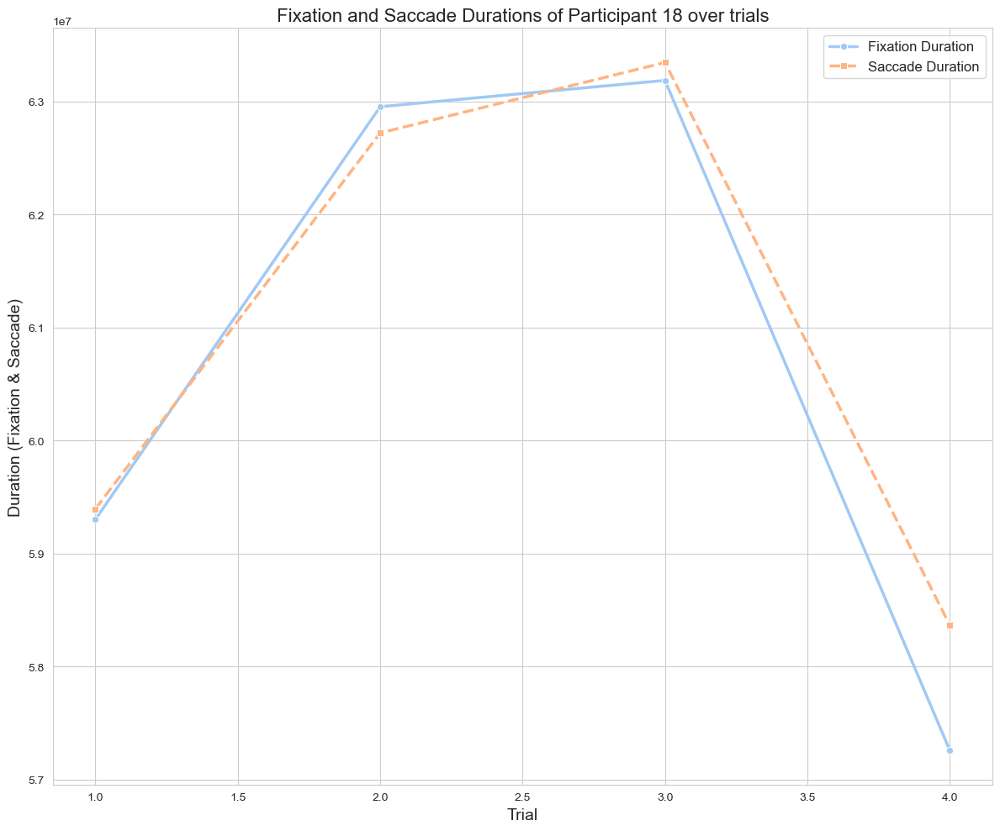

...

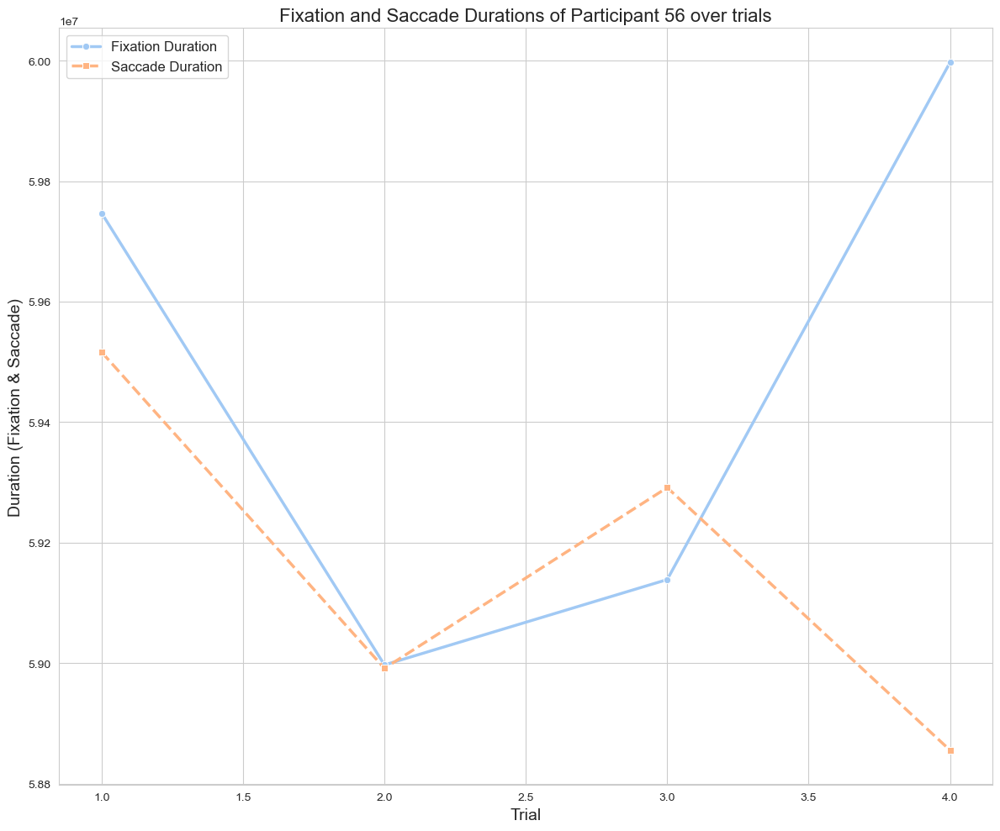

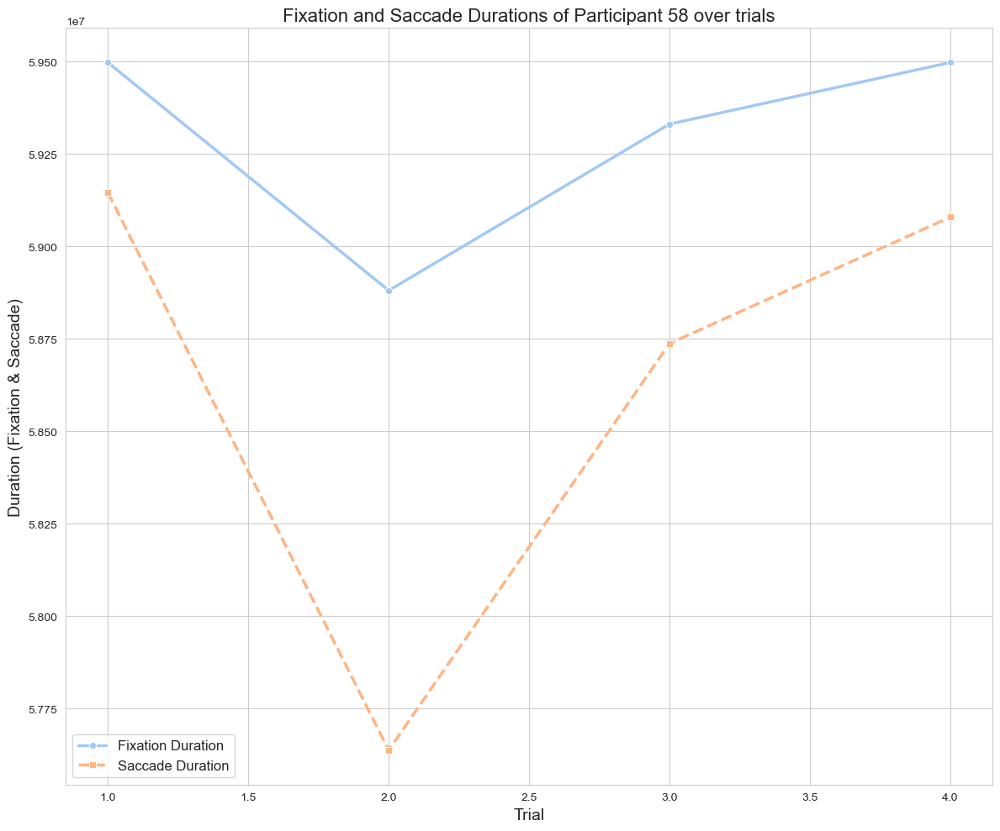

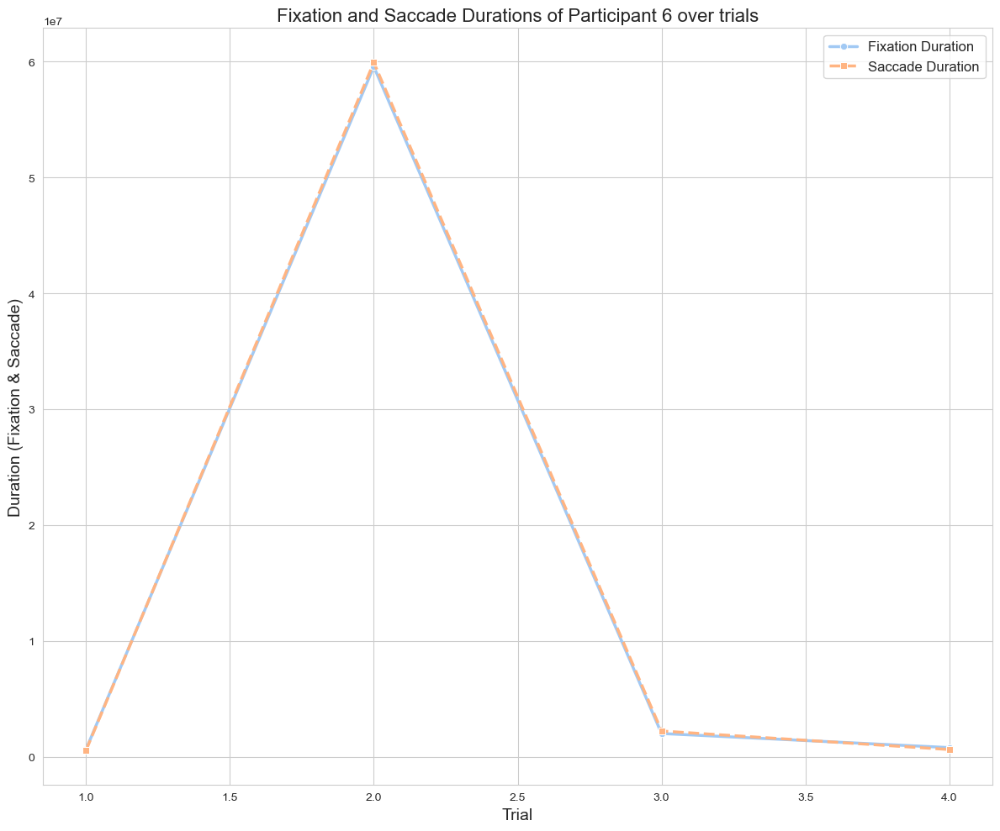

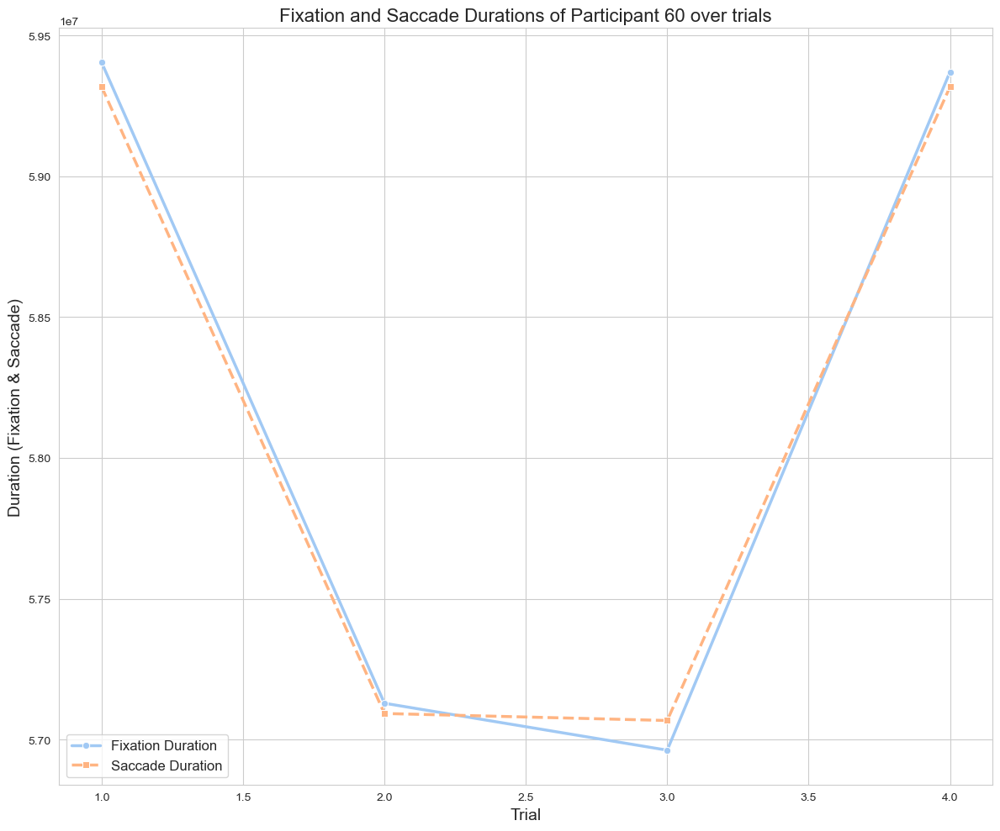

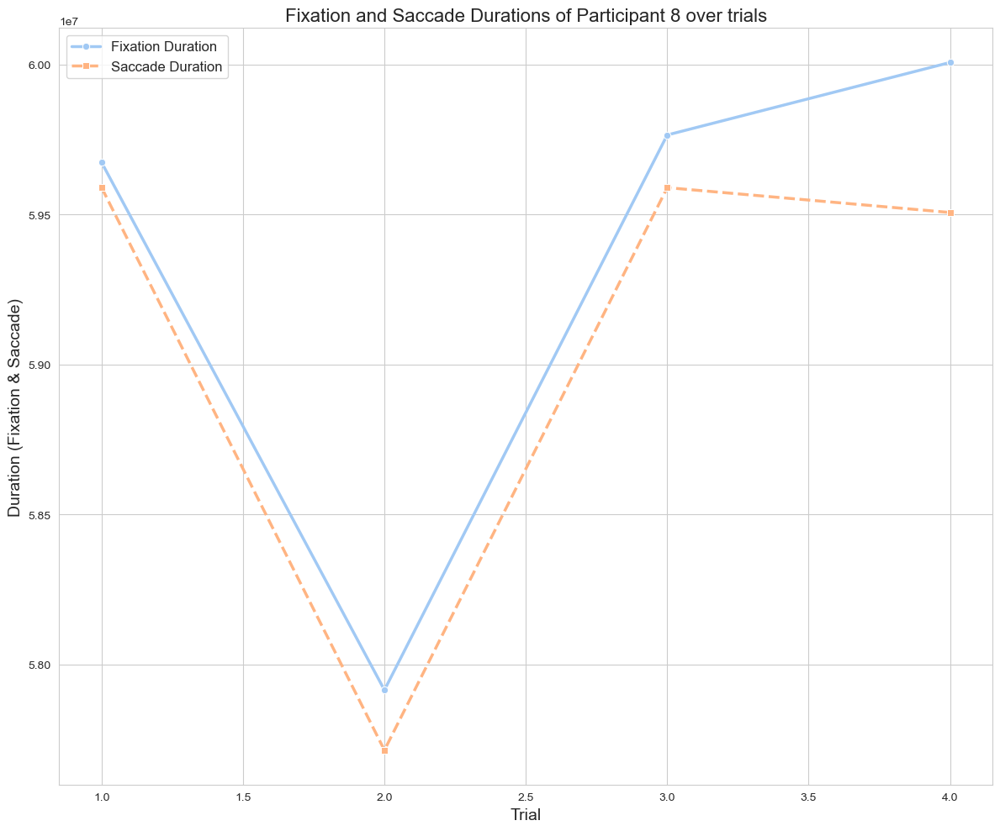

In [41]:
# Iterate over participant groups and plot the Eye movement type
for participant_name, participant_data in control_results_refactored.groupby('Participant'):
    plot_fixation_saccade_durations(participant_data,participant_name)

Plot Avergae Pupil Diameter for each Control Participant

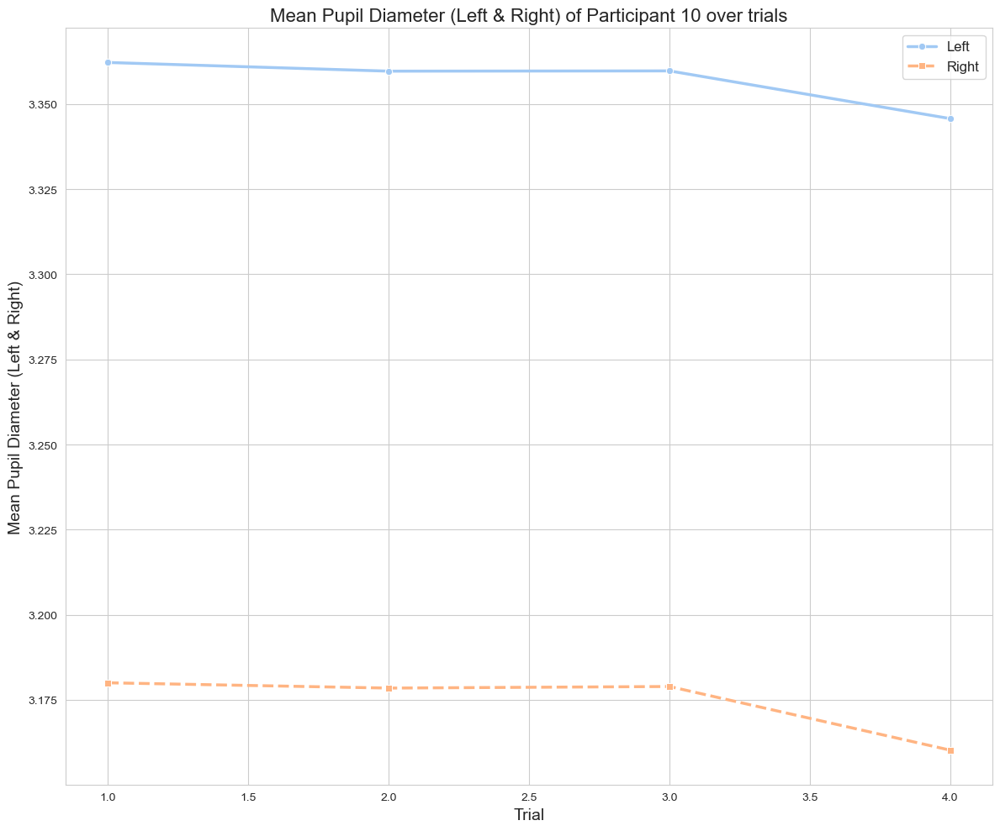

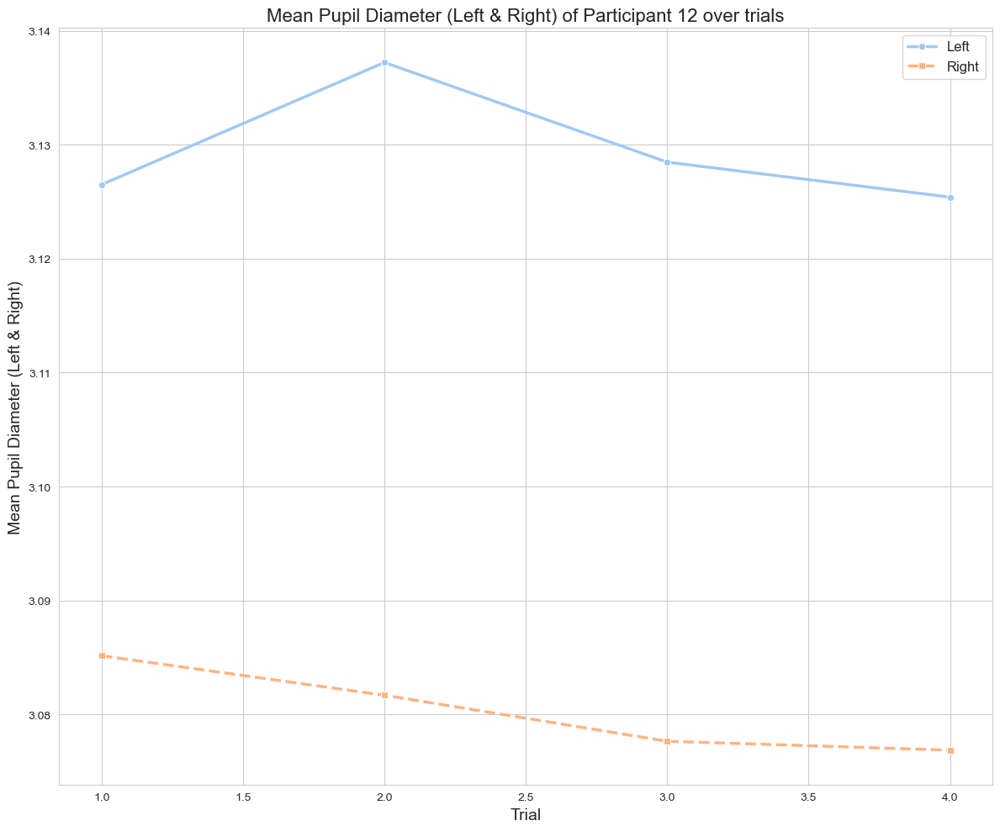

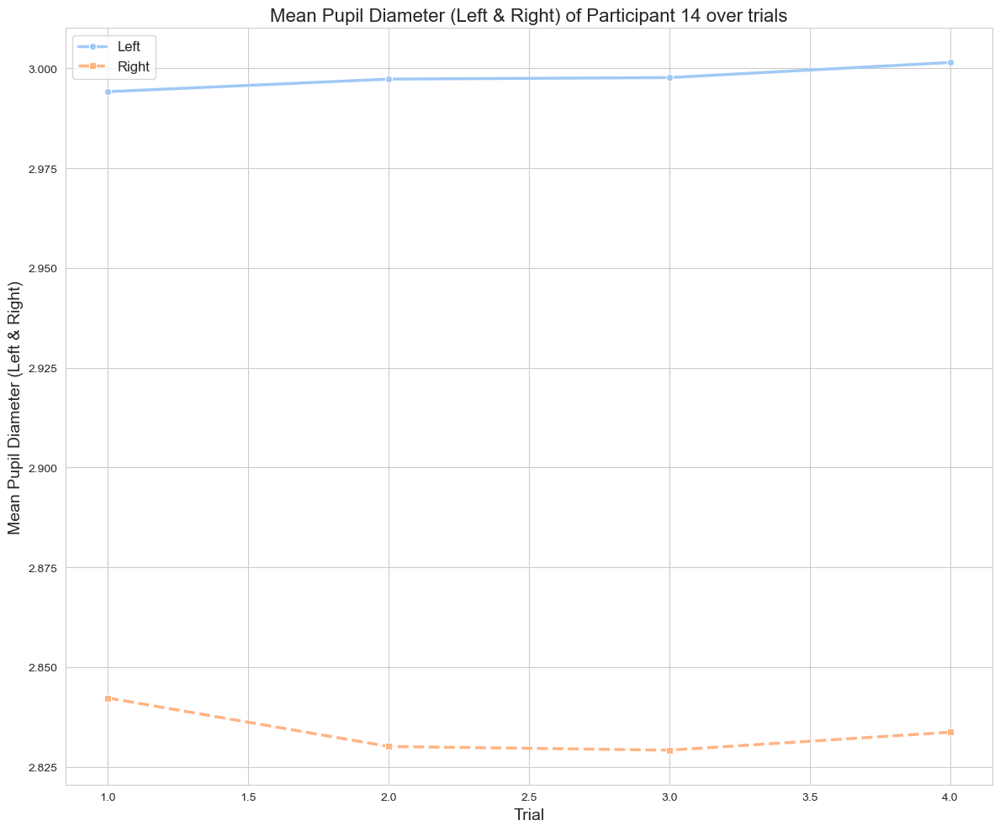

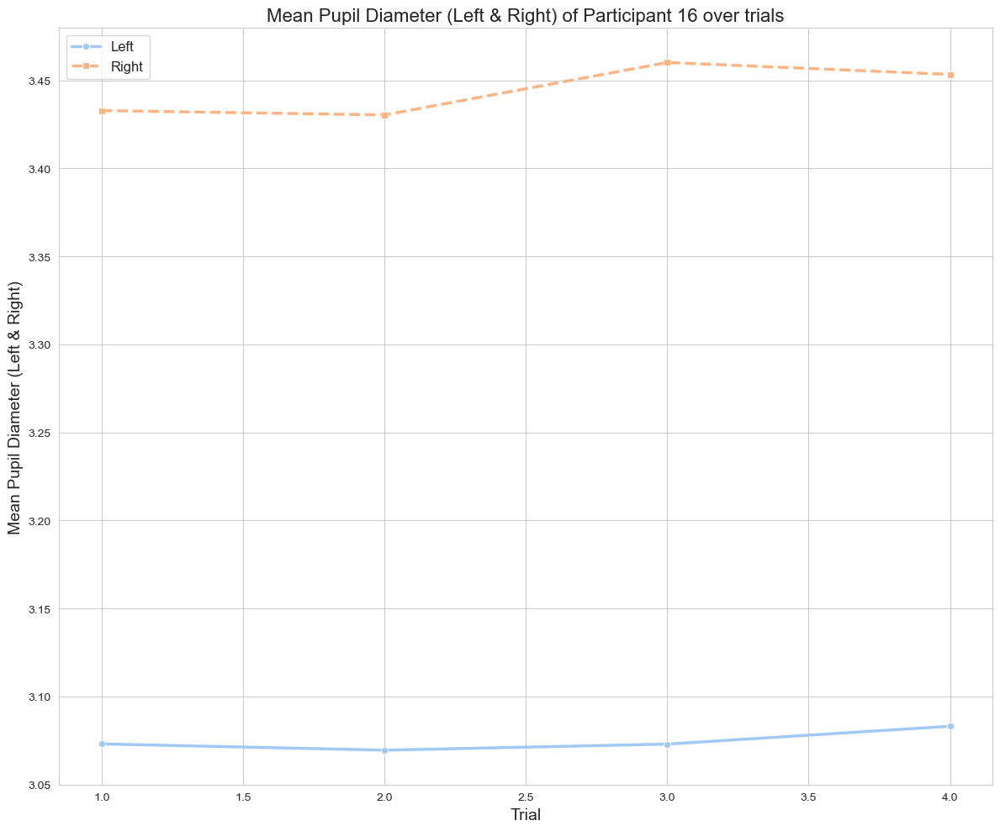

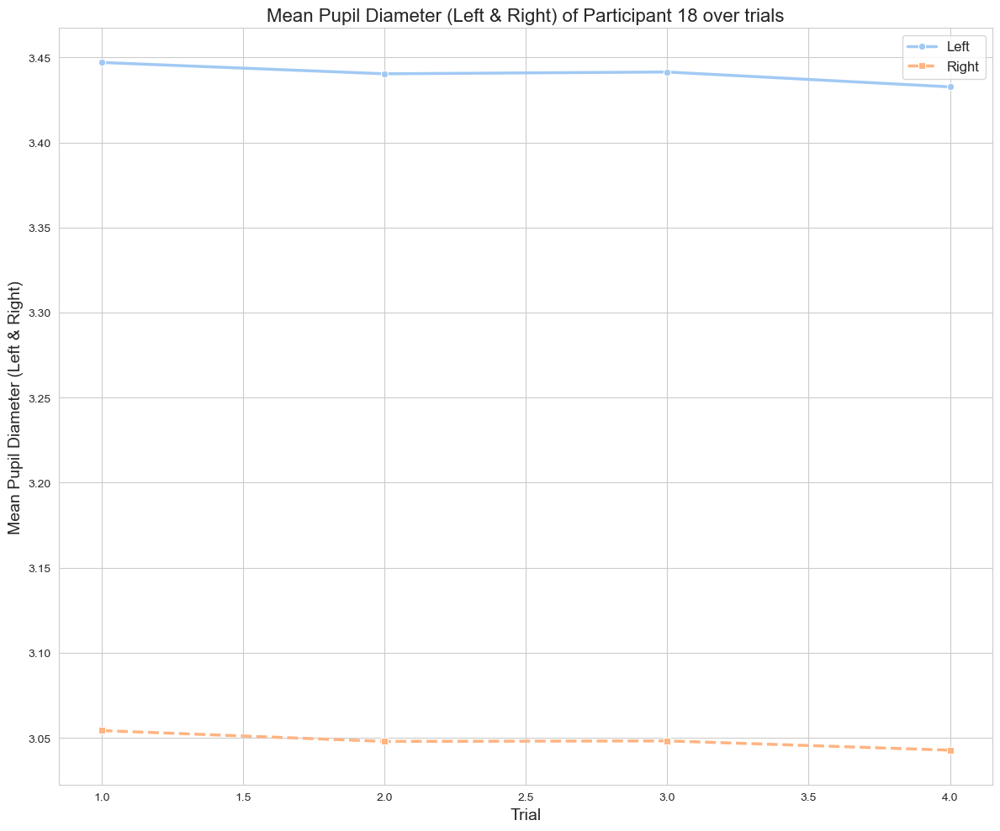

...

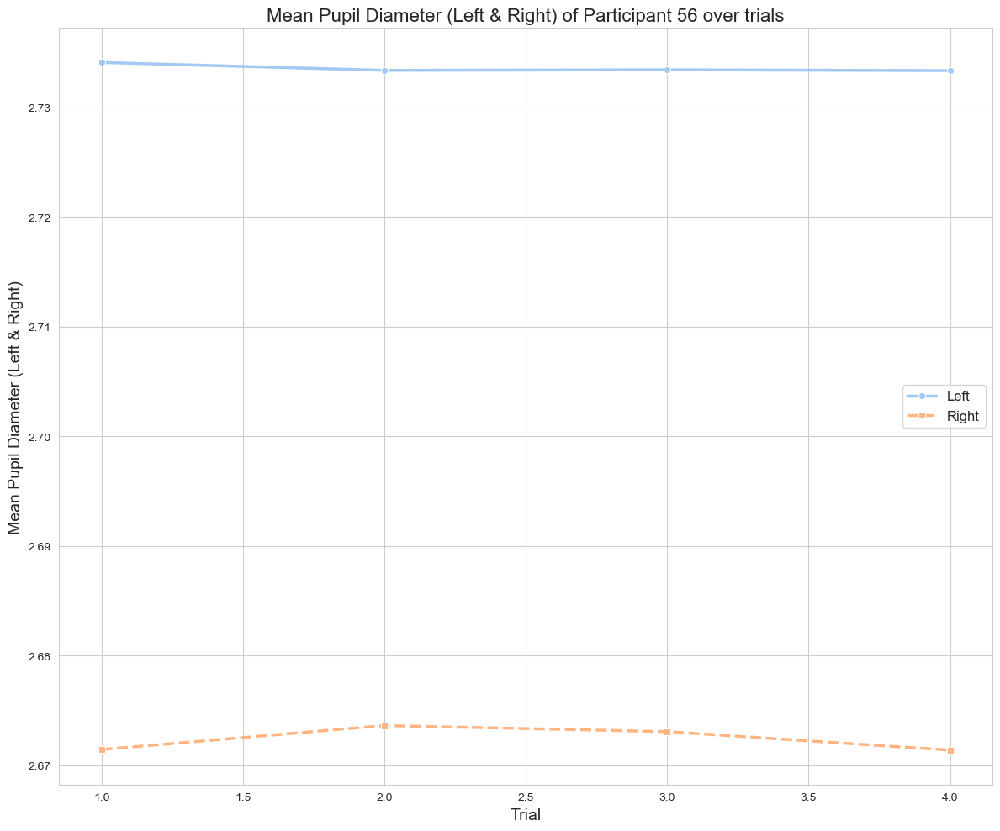

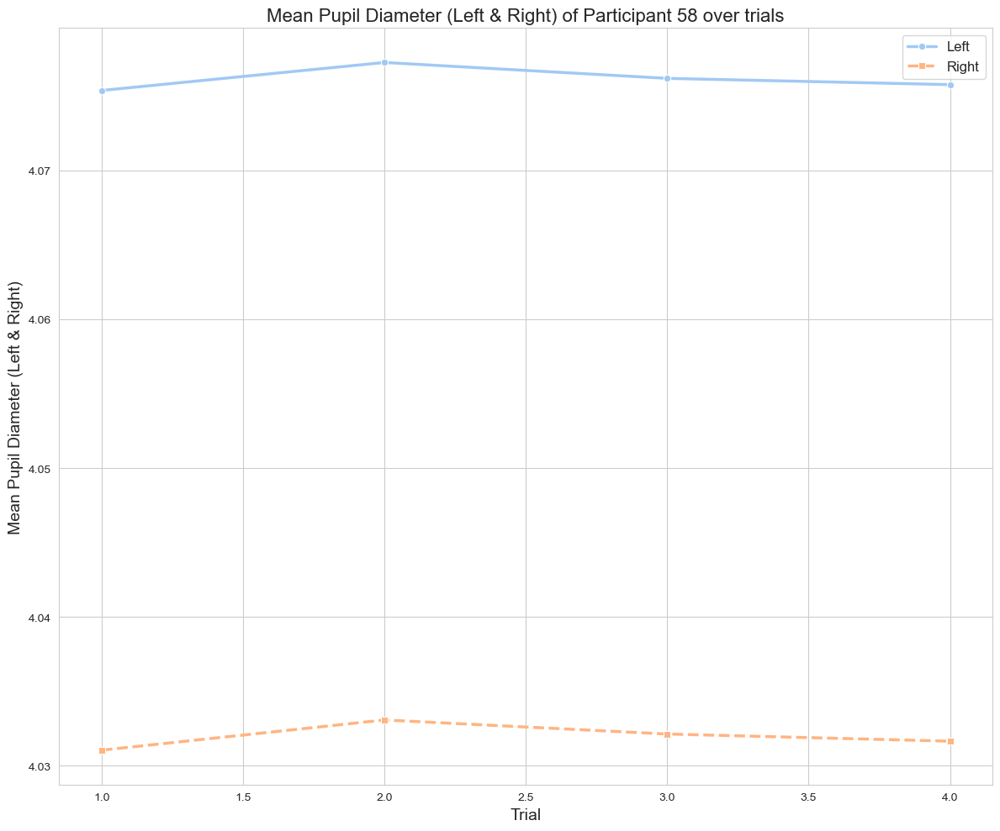

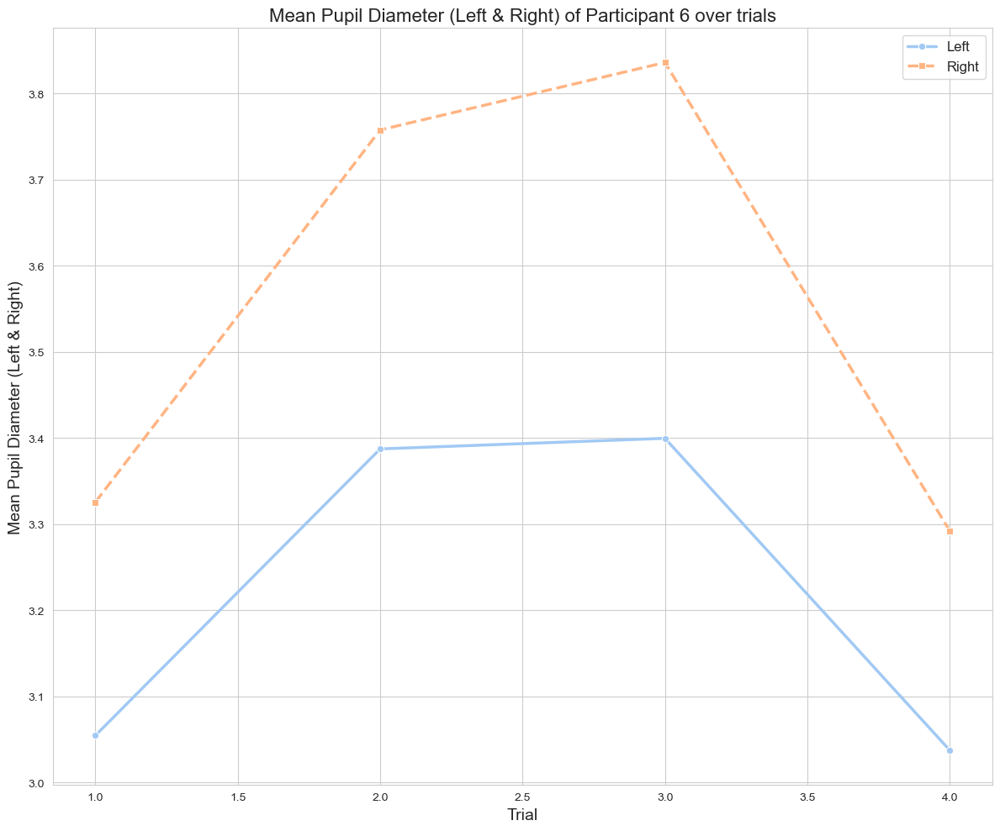

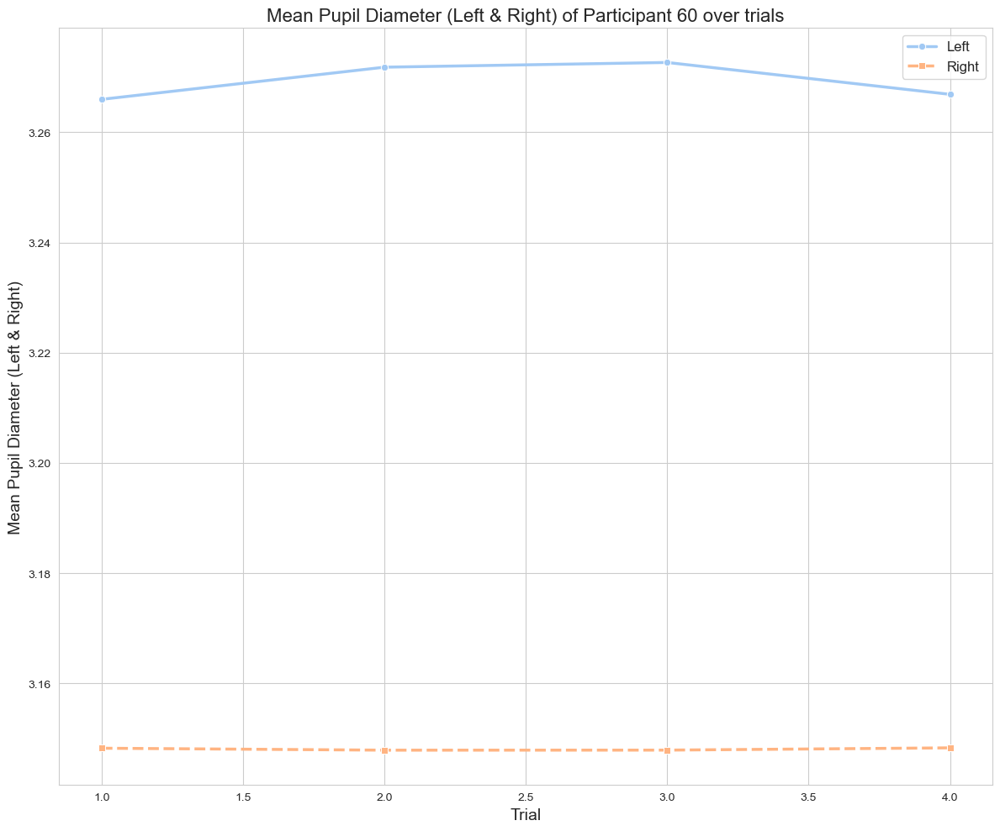

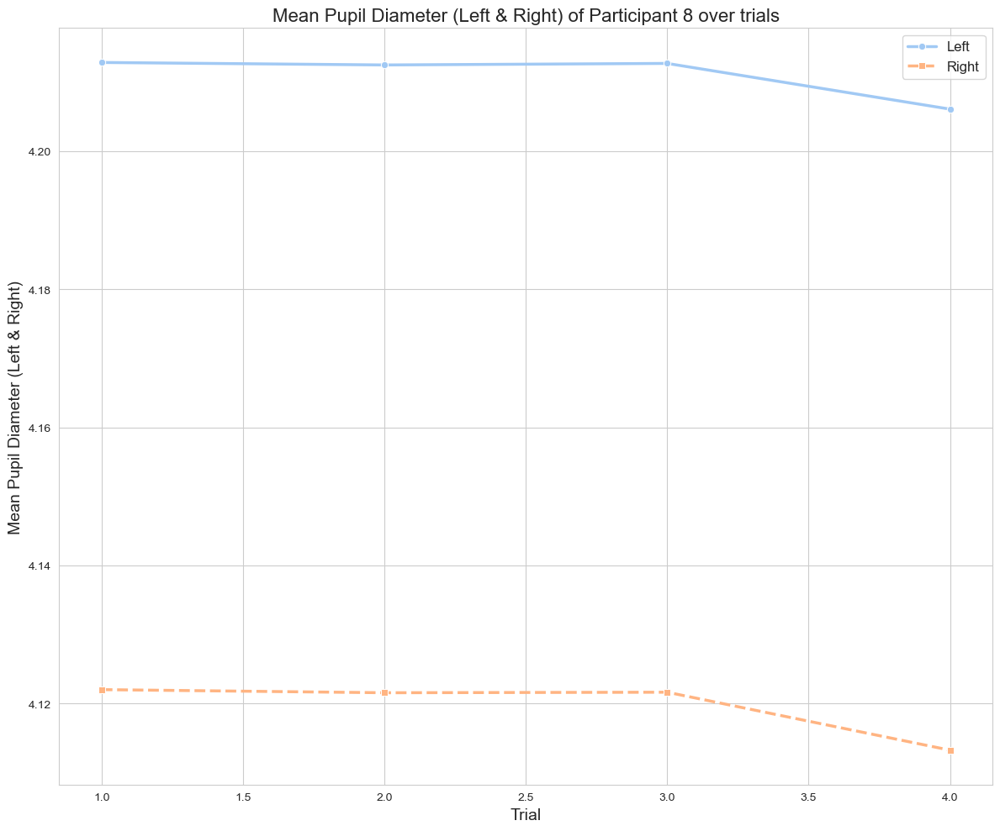

In [42]:
# Iterate over participant groups and plot the pupil diameter data
for participant_name, participant_data in control_results_refactored.groupby('Participant'):
    plot_pupil_diameter(participant_data, participant_name)


In [43]:

# Dictionary to store the dataframes
questionnaire_data = {
    'IA': load_questionnaire('Questionnaire_datasetIA.csv'),
    'IB': load_questionnaire('Questionnaire_datasetIB.csv')
}

# Accessing the dataframes
scoreBeforeIntervention = questionnaire_data['IA']
scoreAfterIntervention = questionnaire_data['IB']

In [44]:
scoreBeforeIntervention.head()

,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9199452,07.09.2020 15:13,07.09.2020 15:13,Yes,Proceed,3,3,4,4,...,1,4,4,4,1,3,4,134,108,5 minutes 5 seconds
1,2,9584002,30.09.2020 11:23,30.09.2020 11:23,Yes,Proceed,3,3,4,4,...,2,4,3,3,4,2,2,133,105,5 minutes 55 seconds
2,3,9112363,02.09.2020 09:17,02.09.2020 09:17,Yes,Proceed,2,2,3,4,...,3,3,3,3,3,3,3,116,81,6 minutes 49 seconds
3,4,9727754,06.10.2020 13:20,06.10.2020 13:20,Yes,Proceed,2,3,4,3,...,2,3,4,4,2,4,2,114,96,8 minutes 39 seconds
4,5,9730232,06.10.2020 14:53,06.10.2020 14:53,Yes,Proceed,3,3,4,4,...,1,4,2,1,4,4,4,138,106,7 minutes 27 seconds


In [45]:
scoreAfterIntervention.head()

,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Total Score extended,Total Score original,Elapsed time
0,1,9534500,24.09.2020 16:00,24.09.2020 16:00,Yes,Proceed,1,3,4,4,...,1,4,4,4,1,2,4,137,109,5 minutes 5 seconds
1,2,9597659,30.09.2020 15:14,30.09.2020 15:14,Yes,Proceed,2,2,4,4,...,2,4,3,3,4,2,2,127,100,5 minutes 55 seconds
2,3,9637453,01.10.2020 16:20,01.10.2020 16:20,Yes,Proceed,4,1,4,4,...,3,3,3,2,3,3,2,123,98,6 minutes 49 seconds
3,4,9732460,06.10.2020 16:45,06.10.2020 16:45,Yes,Proceed,2,3,3,3,...,2,3,4,3,2,4,2,120,95,8 minutes 39 seconds
4,5,9732853,06.10.2020 17:24,06.10.2020 17:24,Yes,Proceed,2,3,4,3,...,3,4,2,1,4,3,4,124,97,7 minutes 27 seconds


In [46]:
# Rename the score columns for clarity
scoreBeforeIntervention = scoreBeforeIntervention.rename(columns={'Total Score extended': 'Score_before'})
scoreAfterIntervention = scoreAfterIntervention.rename(columns={'Total Score extended': 'Score_after'})

scoreAfterIntervention.head()



,Participant nr,NR,Created,Modified,I have read and understood the information about the study and all the information in this form is explained to me and I am willing to participate,I want to participate.,I sometimes find it difficult to see things from the other guys point of view.,"I am usually objective when I watch a film or play, and I dont often get completely caught up in it.",I try to look at everybodys side of a disagreement before I make a decision.,I sometimes try to understand my friends better by imagining how things look from their perspective.,...,"If someone is suffering from stutter, I prefer speaking rather than texting.",I try to be patient when people speak with me very slowly.,"In a situation, when there are handicapped students in a classroom, the pace of the class should be adapted to the handicapped student.","In a situation, when there are only one handicapped student in a classroom, the pace of the class should be adapted to him/her independently of how many students are in the class.","I feel impatient when people communicate slowly, so I complete other peoples sentences to make the communication more efficient.",I believe that the handicapped students should catch the pace of the group in a classroom to not delay the progress of other students.,I feel left out (or excluded) when I cannot participate in a conversation.,Score_after,Total Score original,Elapsed time
0,1,9534500,24.09.2020 16:00,24.09.2020 16:00,Yes,Proceed,1,3,4,4,...,1,4,4,4,1,2,4,137,109,5 minutes 5 seconds
1,2,9597659,30.09.2020 15:14,30.09.2020 15:14,Yes,Proceed,2,2,4,4,...,2,4,3,3,4,2,2,127,100,5 minutes 55 seconds
2,3,9637453,01.10.2020 16:20,01.10.2020 16:20,Yes,Proceed,4,1,4,4,...,3,3,3,2,3,3,2,123,98,6 minutes 49 seconds
3,4,9732460,06.10.2020 16:45,06.10.2020 16:45,Yes,Proceed,2,3,3,3,...,2,3,4,3,2,4,2,120,95,8 minutes 39 seconds
4,5,9732853,06.10.2020 17:24,06.10.2020 17:24,Yes,Proceed,2,3,4,3,...,3,4,2,1,4,3,4,124,97,7 minutes 27 seconds


In [47]:
questionaaire_score = pd.merge(scoreBeforeIntervention, scoreAfterIntervention, on='Participant nr', how='inner')
# Retain only the desired columns
questionaaire_score = questionaaire_score[['Participant nr', 'Score_before', 'Score_after']]
questionaaire_score['Average Score'] = questionaaire_score[['Score_before', 'Score_after']].mean(axis=1)


In [48]:
questionaaire_score.head()

,Participant nr,Score_before,Score_after,Average Score
0,1,134,137,135.5
1,2,133,127,130.0
2,3,116,123,119.5
3,4,114,120,117.0
4,5,138,124,131.0


In [50]:
# Merge the dataframes on the participant number columns
control_DataWithScore_df = pd.merge(control_results_refactored, questionaaire_score[['Average Score', 'Participant nr']], left_on='Participant', right_on='Participant nr', how='inner')
# Drop the redundant 'Participant nr' column
control_DataWithScore_df = control_DataWithScore_df.drop(columns=['Participant nr'])

control_DataWithScore_df.head()

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration,Average Score
0,2,1,2.997752,3.002061,54488678.0,54484989.0,130.0
1,2,2,3.151777,3.242810,994717.0,758446.0,130.0
2,2,3,3.107645,3.085188,950128.0,927993.0,130.0
3,2,4,3.088498,3.054872,1011345.0,575208.0,130.0
4,4,1,3.138972,3.015795,45856328.0,46681404.0,117.0


In [51]:
# Assuming your dataframe is named df
control_DataWithScore_df.to_csv('controlDataWithScore_df.csv', index=False)

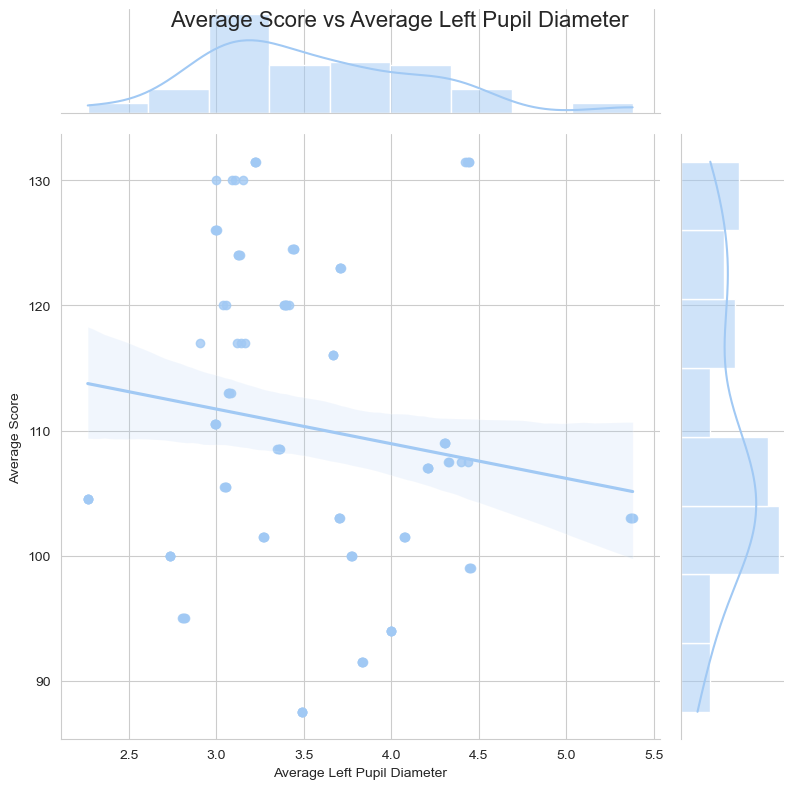

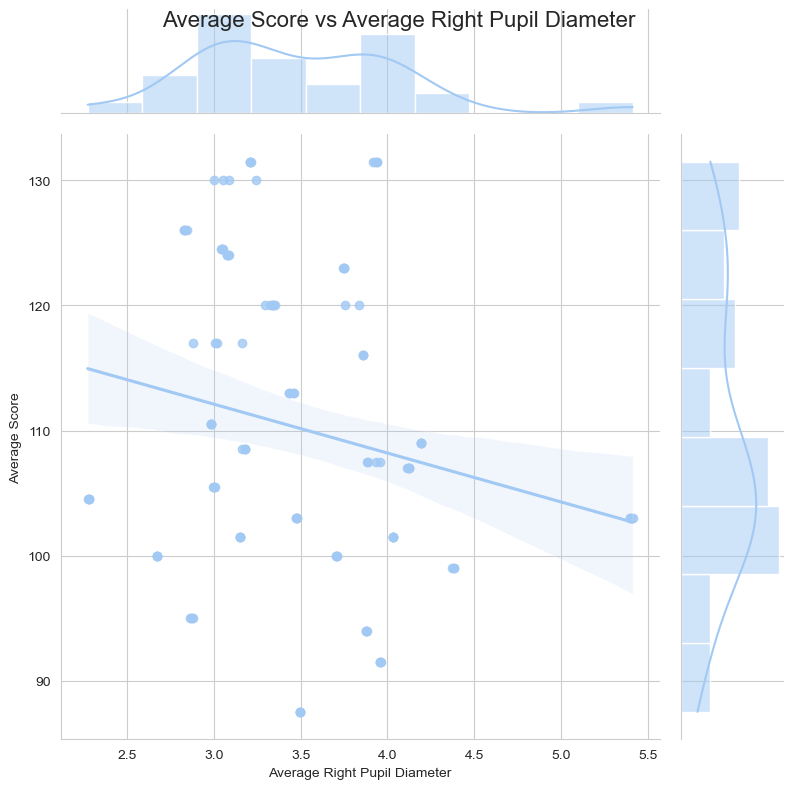

In [52]:
# Joint plots with regression lines
g_left_control = sns.jointplot(data=control_DataWithScore_df, x='Average Left Pupil Diameter', y='Average Score', kind='reg', height=8)
g_left_control.fig.suptitle('Average Score vs Average Left Pupil Diameter', fontsize=16)

g_right_control = sns.jointplot(data=control_DataWithScore_df, x='Average Right Pupil Diameter', y='Average Score', kind='reg', height=8)
g_right_control.fig.suptitle('Average Score vs Average Right Pupil Diameter', fontsize=16)
plt.show()

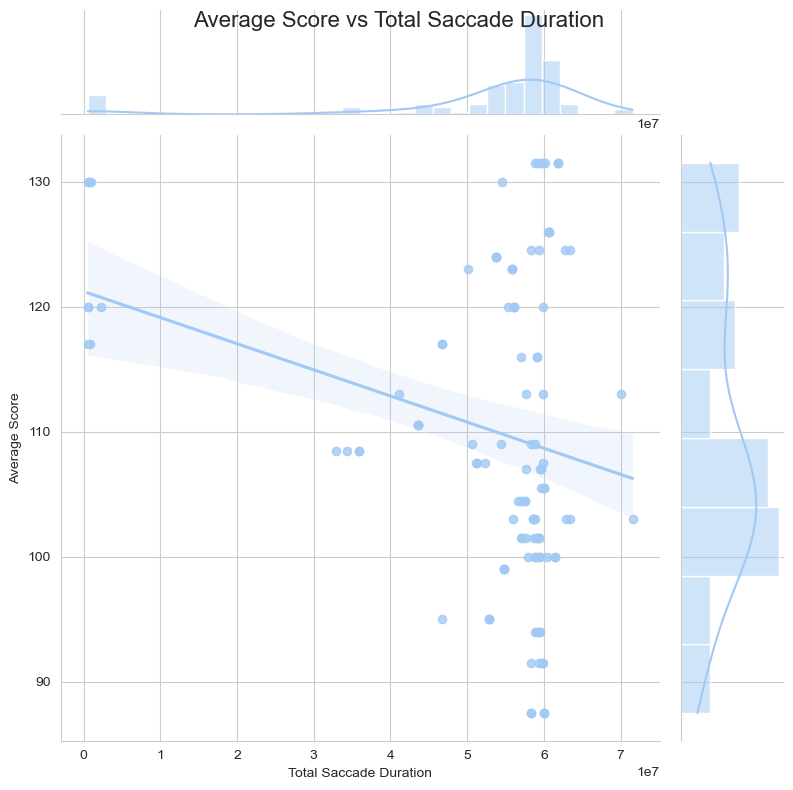

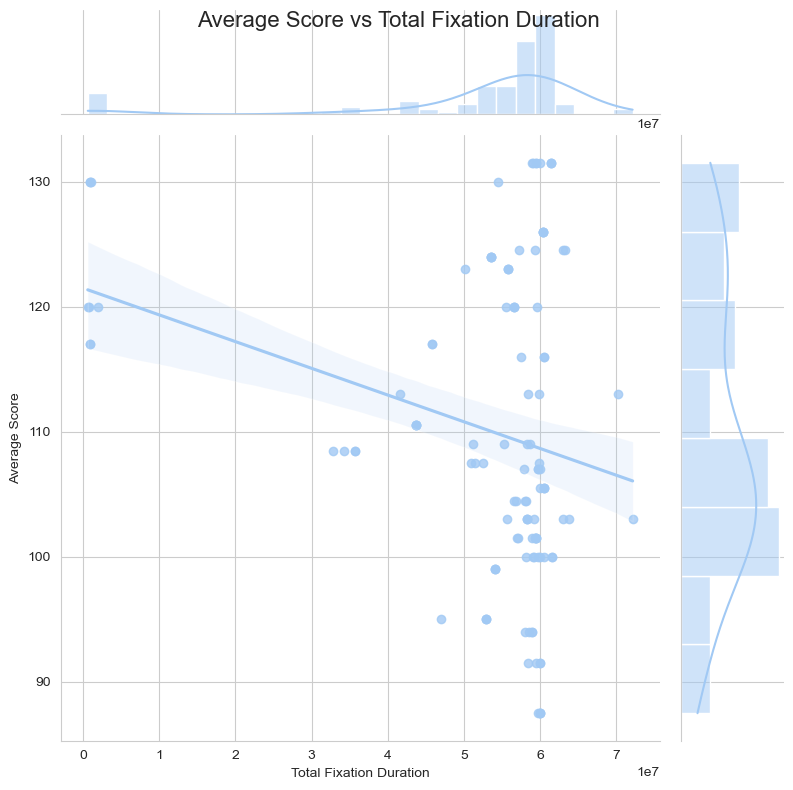

In [53]:
# Joint plots with regression lines for Saccade Duration
g_saccade_control = sns.jointplot(data=control_DataWithScore_df, x='Total Saccade Duration', y='Average Score', kind='reg', height=8)
g_saccade_control.fig.suptitle('Average Score vs Total Saccade Duration', fontsize=16)

# Joint plots with regression lines for Fixation Duration
g_fixation_control = sns.jointplot(data=control_DataWithScore_df, x='Total Fixation Duration', y='Average Score', kind='reg', height=8)
g_fixation_control.fig.suptitle('Average Score vs Total Fixation Duration', fontsize=16)

plt.show()

In [54]:
# Save plots for Saccade and Fixation Duration
g_saccade_control.savefig("g_saccade_control_plot.png")
g_fixation_control.savefig("g_fixation_control_plot.png")

# Save plots for Pupil Diameter
g_left_control.savefig("g_left_control_plot.png")
g_right_control.savefig("g_right_control_plot.png")

In [55]:


# List of variables to be standardized
variables_to_standardize = ['Average Left Pupil Diameter', 'Average Right Pupil Diameter',
                          'Total Fixation Duration', 'Total Saccade Duration']
standardized_dataframe=standardize_columns(control_DataWithScore_df, variables_to_standardize)

In [56]:
standardized_dataframe.head()

,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,-0.852902,-0.790021,0.115355,0.119445
1,-0.611834,-0.395775,-3.386981,-3.399099
2,-0.680906,-0.653894,-3.389900,-3.387995
3,-0.710873,-0.703538,-3.385892,-3.411099
4,-0.631876,-0.767530,-0.449819,-0.391610


In [57]:

resultant_dataframe = control_DataWithScore_df.drop(columns=variables_to_standardize)
resultant_dataframe = pd.concat([resultant_dataframe, standardized_dataframe], axis=1)


In [58]:
resultant_dataframe.head()

,Participant,Trial,Average Score,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,2,1,130.0,-0.852902,-0.790021,0.115355,0.119445
1,2,2,130.0,-0.611834,-0.395775,-3.386981,-3.399099
2,2,3,130.0,-0.680906,-0.653894,-3.389900,-3.387995
3,2,4,130.0,-0.710873,-0.703538,-3.385892,-3.411099
4,4,1,117.0,-0.631876,-0.767530,-0.449819,-0.391610


In [59]:
null_percentage_df = compute_null_percentage(resultant_dataframe)
null_percentage_df

,Column,Percentage of Nulls
0,Participant,0.0
1,Trial,0.0
2,Average Score,0.0
3,Average Left Pupil Diameter,0.0
4,Average Right Pupil Diameter,0.0
5,Total Fixation Duration,0.0
6,Total Saccade Duration,0.0


In [60]:

# Splitting the data for the current participant
X = resultant_dataframe.drop(['Average Score', 'Participant','Trial'], axis=1)
y = resultant_dataframe['Average Score']





In [61]:
X_train, y_train, X_test, y_test = split_data_using_groups(resultant_dataframe)

In [62]:
X_train.head(50)

,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,-0.852902,-0.790021,0.115355,0.119445
1,-0.611834,-0.395775,-3.386981,-3.399099
2,-0.680906,-0.653894,-3.389900,-3.387995
3,-0.710873,-0.703538,-3.385892,-3.411099
4,-0.631876,-0.767530,-0.449819,-0.391610
5,-0.594825,-0.531585,-3.388116,-3.397251
6,-0.663885,-0.784575,-0.449819,-0.391610
7,-0.999356,-0.986507,-3.391318,-3.412526
12,1.048865,1.043994,0.454812,0.453752
13,1.048302,1.043253,0.339700,0.330968


In [63]:
X_test.head(50)

,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
8,-0.764005,-0.260354,-3.410243,-3.412088
9,-0.243224,0.447297,0.448048,0.475951
10,-0.224003,0.575547,-3.321185,-3.303846
11,-0.790692,-0.314894,-3.400906,-3.408382
44,1.373813,0.705880,0.570101,0.604354
45,1.397442,0.728486,0.570101,0.604354
46,1.415331,0.745059,0.470811,0.490304
47,1.410615,0.742974,0.570101,0.603808
48,0.194542,0.617562,0.504318,0.421951
49,0.195565,0.617328,0.504318,0.421951


In [64]:
y_train.head()

0    130.0
1    130.0
2    130.0
3    130.0
4    117.0
Name: Average Score, dtype: float64

In [65]:
lasso_control_rmse, lasso_control_r2 = apply_lasso_cv(X_train, y_train, X_test, y_test)
print(f"LASSO - RMSE: {lasso_control_rmse:.2f}, R^2 Score: {lasso_control_r2:.2f}")

LASSO - RMSE: 15.40, R^2 Score: -0.01


In [66]:
# Initialize Linear Regression model
linear_reg = LinearRegression()

# Initialize Random Forest model
rf = RandomForestRegressor(random_state=0)

# Applying LASSO with cross-validation
lasso_cv = LassoCV(cv=5, random_state=0)

In [67]:
# Models
models = [lasso_cv, rf, linear_reg]
model_names = ['LassoCV', 'Random Forest', 'Linear Regression']

# Lists to store results
r2_scores = []
rmse_scores = []

# Calculate scores for each model
for model in models:
    mean_r2, mean_rmse = group_cross_val_scores(model, X, y, groups=resultant_dataframe['Participant'])
    r2_scores.append(mean_r2)
    rmse_scores.append(mean_rmse)

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Model': model_names,
    'Mean R^2': r2_scores,
    'Mean RMSE': rmse_scores
})

# Display the results in a table format
print(results_df)

               Model  Mean R^2  Mean RMSE
0            LassoCV -0.007666  15.400604
1      Random Forest -0.363139  17.912230
2  Linear Regression  0.097525  14.574613


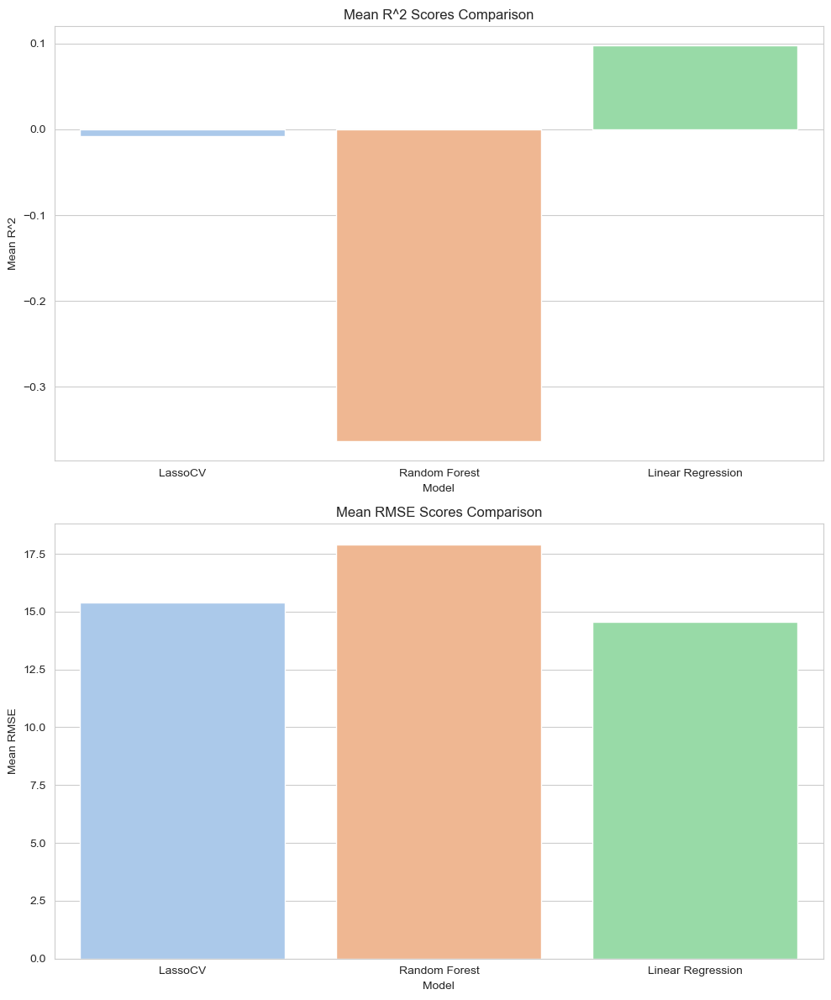

In [68]:
# Set up the figure and axes
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

# R^2 scores bar plot
sns.barplot(x='Model', y='Mean R^2', data=results_df, ax=ax[0])
ax[0].set_title('Mean R^2 Scores Comparison')

# RMSE scores bar plot
sns.barplot(x='Model', y='Mean RMSE', data=results_df, ax=ax[1])
ax[1].set_title('Mean RMSE Scores Comparison')

plt.tight_layout()
plt.show()

In [69]:
combined_data_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3776742 entries, 0 to 8422
Data columns (total 71 columns):
 #   Column                               Dtype  
---  ------                               -----  
 0   Unnamed: 0                           int64  
 1   Recording timestamp                  int64  
 2   Computer timestamp                   int64  
 3   Sensor                               object 
 4   Project name                         object 
 5   Export date                          object 
 6   Participant name                     object 
 7   Recording name                       object 
 8   Recording date                       object 
 9   Recording date UTC                   object 
 10  Recording start time                 object 
 11  Recording start time UTC             object 
 12  Recording duration                   int64  
 13  Timeline name                        object 
 14  Recording Fixation filter name       object 
 15  Recording software version         

In [70]:
combined_data_test.describe()

,Unnamed: 0,Recording timestamp,Computer timestamp,Recording duration,Recording resolution height,Recording resolution width,Eyetracker timestamp,Gaze point X,Gaze point Y,Gaze point left X,...,Presented Media position X (DACSpx),Presented Media position Y (DACSpx),Original Media width,Original Media height,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Mouse position X,Mouse position Y
count,3.776742e+06,3.776742e+06,3.776742e+06,3.776742e+06,3776742.0,3776742.0,3.735538e+06,3.317149e+06,3.317149e+06,3.031030e+06,...,3774665.0,3774665.0,3.774665e+06,3.774665e+06,3.776108e+06,3.776108e+06,1.957041e+06,1.957041e+06,39169.000000,39169.000000
mean,1.131447e+05,6.214769e+07,6.292691e+11,1.176839e+05,1080.0,1920.0,4.735393e+09,9.111892e+02,4.670267e+02,8.458756e+02,...,214.0,0.0,1.658110e+03,1.199649e+03,2.243196e+02,4.258046e+02,9.073024e+02,4.670525e+02,-366.339810,790.025556
std,1.153506e+05,4.254262e+07,9.011457e+11,4.792558e+04,0.0,0.0,1.304813e+10,2.927975e+02,3.005716e+02,2.976118e+02,...,0.0,0.0,5.101135e+02,3.690577e+02,5.545135e+02,5.914982e+02,2.814317e+02,3.028226e+02,472.512844,303.446306
min,5.660000e+02,3.113686e+06,5.120924e+08,2.340900e+04,1080.0,1920.0,5.040996e+07,-3.810000e+02,-2.160000e+02,-3.810000e+02,...,214.0,0.0,8.970000e+02,6.490000e+02,8.000000e+00,1.000000e+00,-2.890000e+02,-2.140000e+02,-1730.000000,-118.000000
25%,3.567300e+04,2.831733e+07,1.399913e+09,7.436000e+04,1080.0,1920.0,1.071026e+09,7.460000e+02,2.480000e+02,6.790000e+02,...,214.0,0.0,8.970000e+02,6.490000e+02,2.500000e+01,1.070000e+02,7.720000e+02,2.550000e+02,-508.000000,639.000000
50%,7.036200e+04,5.260853e+07,9.157903e+09,1.134320e+05,1080.0,1920.0,1.547097e+09,9.100000e+02,4.840000e+02,8.450000e+02,...,214.0,0.0,2.000000e+03,1.447000e+03,1.080000e+02,2.240000e+02,9.070000e+02,4.790000e+02,-400.000000,904.000000
75%,1.424470e+05,8.832156e+07,1.301558e+12,1.496190e+05,1080.0,1920.0,3.731776e+09,1.054000e+03,7.080000e+02,9.970000e+02,...,214.0,0.0,2.000000e+03,1.447000e+03,2.500000e+02,4.610000e+02,1.029000e+03,7.160000e+02,-232.000000,993.000000
max,5.298970e+05,2.332096e+08,4.234413e+12,2.333600e+05,1080.0,1920.0,8.072037e+10,2.304000e+03,2.374000e+03,2.304000e+03,...,214.0,0.0,2.000000e+03,1.447000e+03,1.428300e+04,5.126000e+03,2.298000e+03,2.055000e+03,1450.000000,1308.000000


In [71]:
null_percentage_df = compute_null_percentage(combined_data_test)
null_percentage_df

,Column,Percentage of Nulls
0,Unnamed: 0,0.000000
1,Recording timestamp,0.000000
2,Computer timestamp,0.000000
3,Sensor,0.053882
4,Project name,0.000000
...,...,...
66,Fixation point Y,48.181766
67,Fixation point X (MCSnorm),53.136539
68,Fixation point Y (MCSnorm),53.136539
69,Mouse position X,98.962889


In [72]:
combined_data_test.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,3082,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
1,3083,23419315,512092386,NaN,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,NaN,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
2,3084,23426120,512099191,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
3,3085,23434449,512107520,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN
4,3086,23442782,512115853,Eye Tracker,Test group experiment,29.10.2020,Participant0001,Recording1,24.09.2020,24.09.2020,...,649.0,Fixation,117.0,64.0,971.0,341.0,"0,5073","0,3160",NaN,NaN


In [73]:
participant_counts_test = count_unique_recordings_by_participant(combined_data_test)

Lets see how many trials each participant did in control group

In [74]:
# Convert the series to a DataFrame
participant_counts_table = participant_counts_test.reset_index()
participant_counts_table.columns = ['Participant Name', 'Unique Recording Count']

# Display the table
print(participant_counts_table)


   Participant Name  Unique Recording Count
0   Participant0001                       8
1   Participant0003                       8
2   Participant0005                       8
3   Participant0007                       8
4   Participant0009                       8
5   Participant0011                       8
6   Participant0013                       8
7   Participant0015                       8
8   Participant0017                       8
9   Participant0019                       8
10  Participant0021                       8
11  Participant0023                       8
12  Participant0025                       8
13  Participant0027                       8
14  Participant0029                       8
15  Participant0031                       8
16  Participant0033                       8
17  Participant0035                       8
18  Participant0037                       8
19  Participant0039                       8
20  Participant0041                       8
21  Participant0043             

In [75]:
eye_movement_counts =combined_data_test['Eye movement type'].value_counts()
# Convert the Series to a DataFrame for table display
eye_movement_table = eye_movement_counts.reset_index()
eye_movement_table.columns = ['Eye Movement Type', 'Count']

eye_movement_table

,Eye Movement Type,Count
0,Fixation,1957041
1,Saccade,764494
2,Unclassified,643215
3,EyesNotFound,411358


Clean the Test dataset

In [76]:
# Subset the dataset to only the desired columns
test_prediction_df =cleanedPredictionDataset(combined_data_test)

In [77]:
null_percentage_df = compute_null_percentage(test_prediction_df)
null_percentage_df

,Column,Percentage of Nulls
0,Participant name,0.000000
1,Recording timestamp,0.000000
2,Recording name,0.000000
3,Eye movement type,0.016787
4,Pupil diameter left,76.069003
5,Pupil diameter right,75.472378
6,Event,99.946118


Apply Imputation for the columns - Pupil diameter left, Pupil diameter right and Eye movement type

In [78]:

# Apply the  imputation function
test_prediction_df_interpolated = getImputedDataSet(test_prediction_df.copy())

In [79]:

# Reset index after groupby operation
test_prediction_df_interpolated.reset_index(drop=True, inplace=True)

In [80]:
# Display the first few rows of the interpolated dataframe
test_prediction_df_interpolated.head(20)

,Participant name,Recording timestamp,Recording name,Eye movement type,Pupil diameter left,Pupil diameter right,Event
0,Participant0001,23419315,Recording1,Fixation,3.21,3.14,Eye tracker Calibration end
1,Participant0001,23419315,Recording1,Fixation,3.21,3.14,ImageStimulusStart
2,Participant0001,23426120,Recording1,Fixation,3.21,3.14,NaN
3,Participant0001,23434449,Recording1,Fixation,3.21,3.14,NaN
4,Participant0001,23442782,Recording1,Fixation,3.21,3.14,NaN
5,Participant0001,23451119,Recording1,Fixation,3.21,3.14,NaN
6,Participant0001,23459447,Recording1,Fixation,3.21,3.14,NaN
7,Participant0001,23467779,Recording1,Fixation,3.15,3.31,NaN
8,Participant0001,23476117,Recording1,Fixation,3.15,3.31,NaN
9,Participant0001,23484445,Recording1,Fixation,3.15,3.31,NaN


In [81]:
null_percentage_test_df = compute_null_percentage(test_prediction_df_interpolated)
null_percentage_test_df

,Column,Percentage of Nulls
0,Participant name,0.000000
1,Recording timestamp,0.000000
2,Recording name,0.000000
3,Eye movement type,0.000000
4,Pupil diameter left,0.000000
5,Pupil diameter right,0.000000
6,Event,99.946118


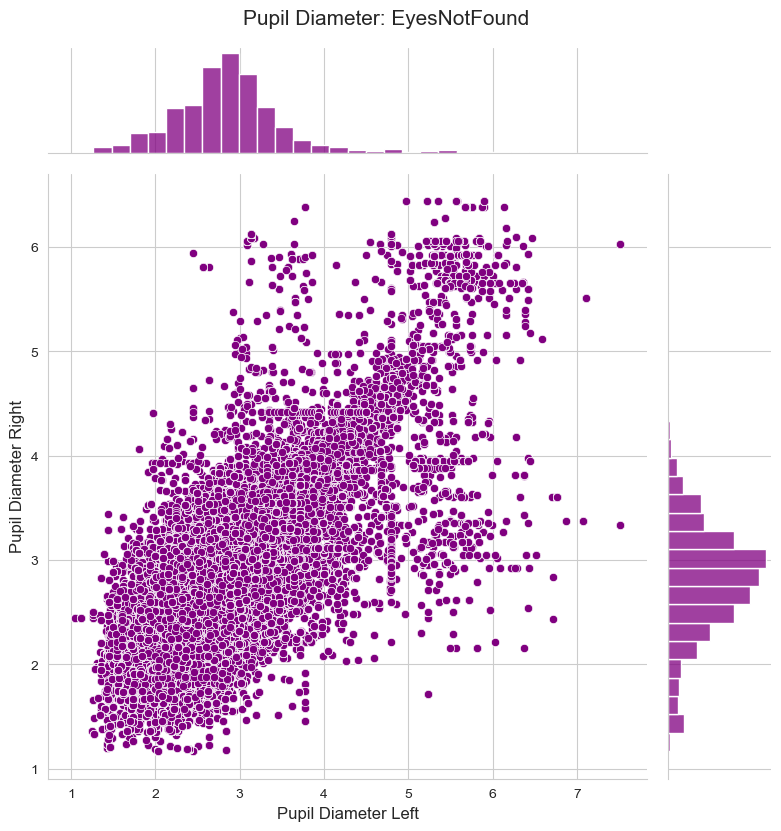

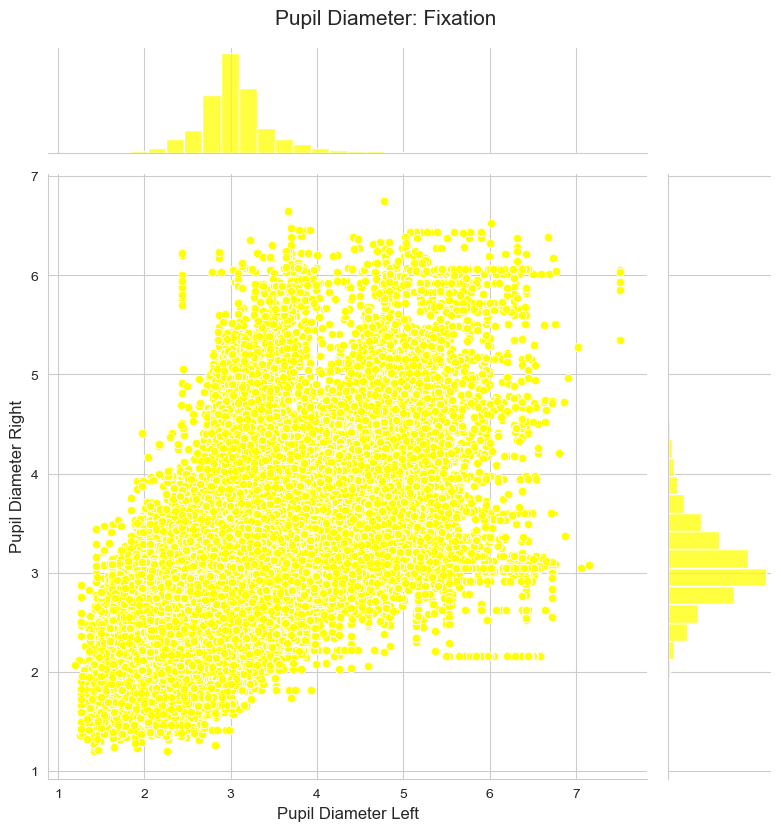

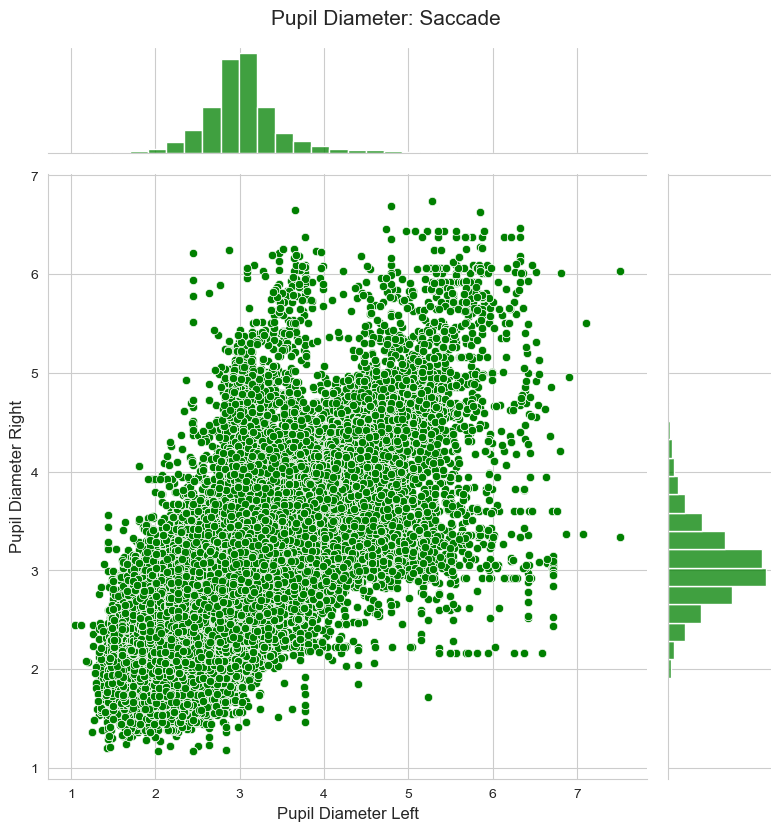

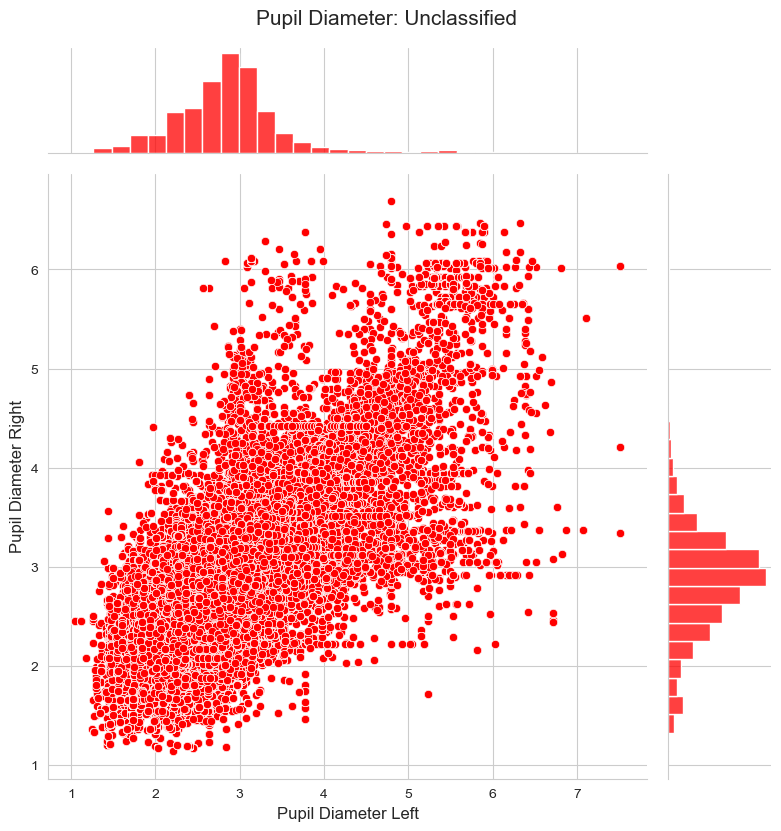

In [82]:
plotEyeMovementData(test_prediction_df_interpolated)

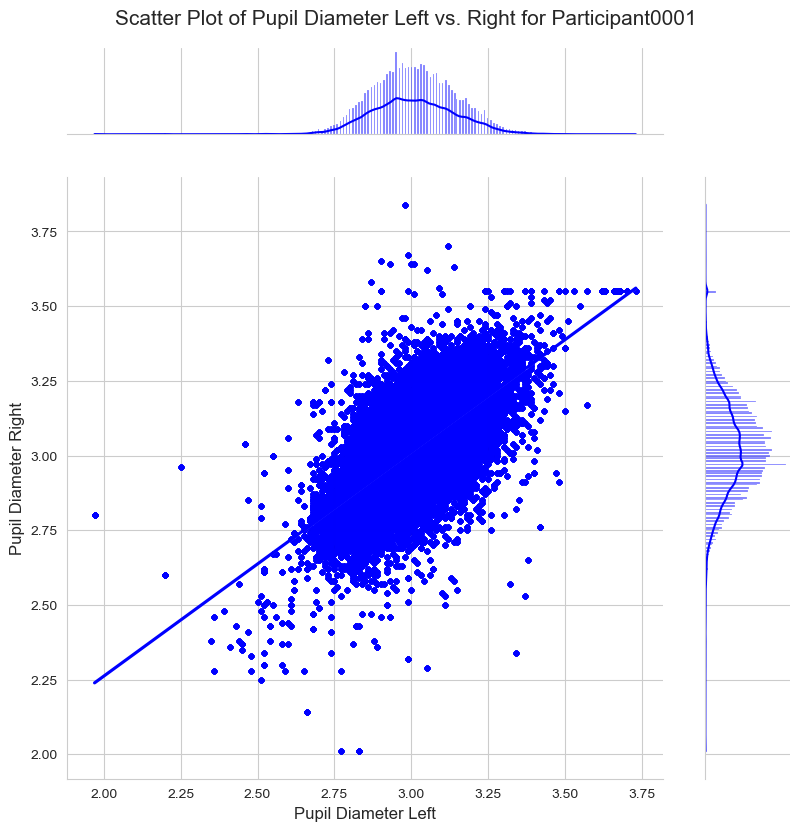

In [83]:
plotParticipantPupilData(test_prediction_df_interpolated, "Participant0001")

In [84]:
# Group the dataframe by 'Participant name'
grouped_by_participant = test_prediction_df_interpolated.groupby('Participant name')

# Apply the 'calculate_eye_metrics' function to each group
participant_results = grouped_by_participant.apply(calculate_eye_metrics)

# Reset the index for the final result
test_results_optimized = participant_results.reset_index(drop=True)


| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 23419315 | 83434461 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 13725441 | 73740598 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 4422823 | 64438148 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 5332509 | 103163704 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 5937126 | 71968852 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0001 | 12662134 | 136592453 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|--------------

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 4241927 | 60791373 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 4807170 | 114772555 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 4100068 | 103498952 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 5854027 | 123752716 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 5055796 | 131304411 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0017 | 5611535 | 44377718 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|---------------

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0031 | 3767906 | 211682410 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0031 | 5197239 | 187495229 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0031 | 4230809 | 54413591 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0033 | 4170992 | 50137078 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0033 | 5437019 | 23403515 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0033 | 3846986 | 48563102 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0045 | 4872839 | 39439212 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0047 | 6287057 | 23236900 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0047 | 3901135 | 64850333 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0047 | 4287799 | 44604021 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0047 | 3796856 | 78112802 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0047 | 3912467 | 88444783 |
| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|-

| Participant Name | Start Timestamp | End Timestamp |
|------------------|-----------------|---------------|
| Participant0059 | 3687452 | 63320155 |


In [85]:
test_results_optimized['Participant'] = test_results_optimized['Participant'].str.replace(r'Participant0*', '', regex=True)

In [86]:
test_results_optimized.head()

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,1,1,3.012729,3.022959,17384828.0,18661218.0
1,1,2,3.012032,3.022991,17384828.0,18661218.0
2,1,3,3.008432,3.019709,17384828.0,18661218.0
3,1,4,3.009897,3.019732,17384828.0,18661218.0
4,1,5,3.011333,3.022471,17384828.0,18661218.0


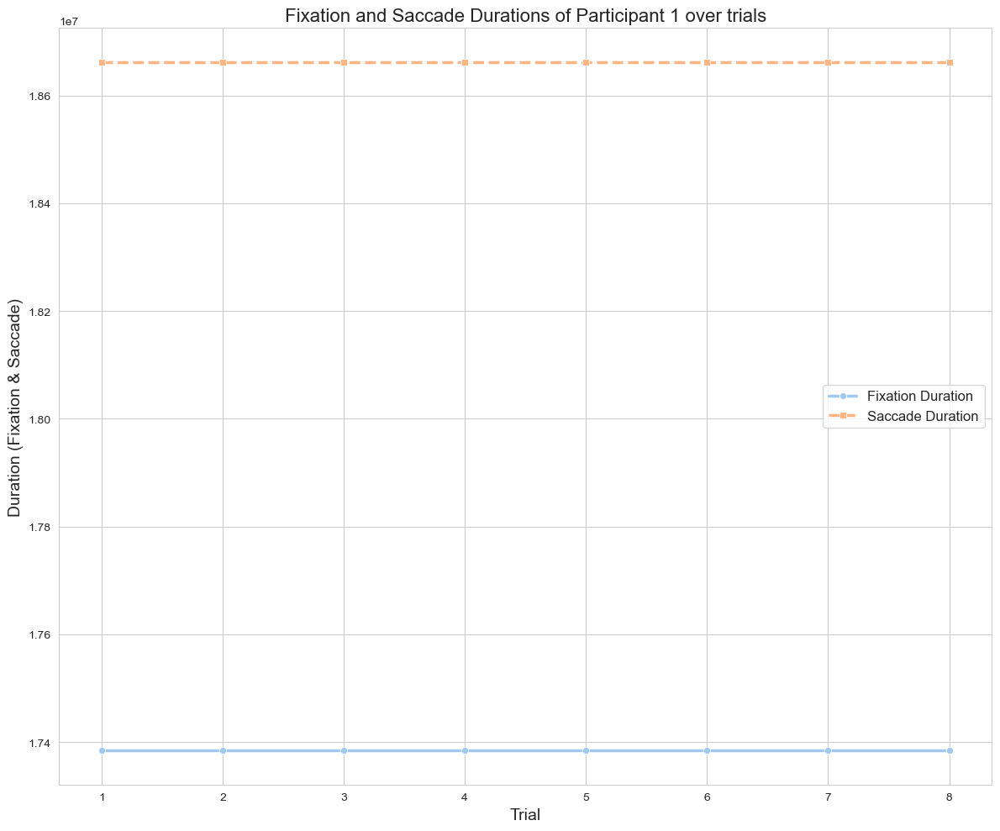

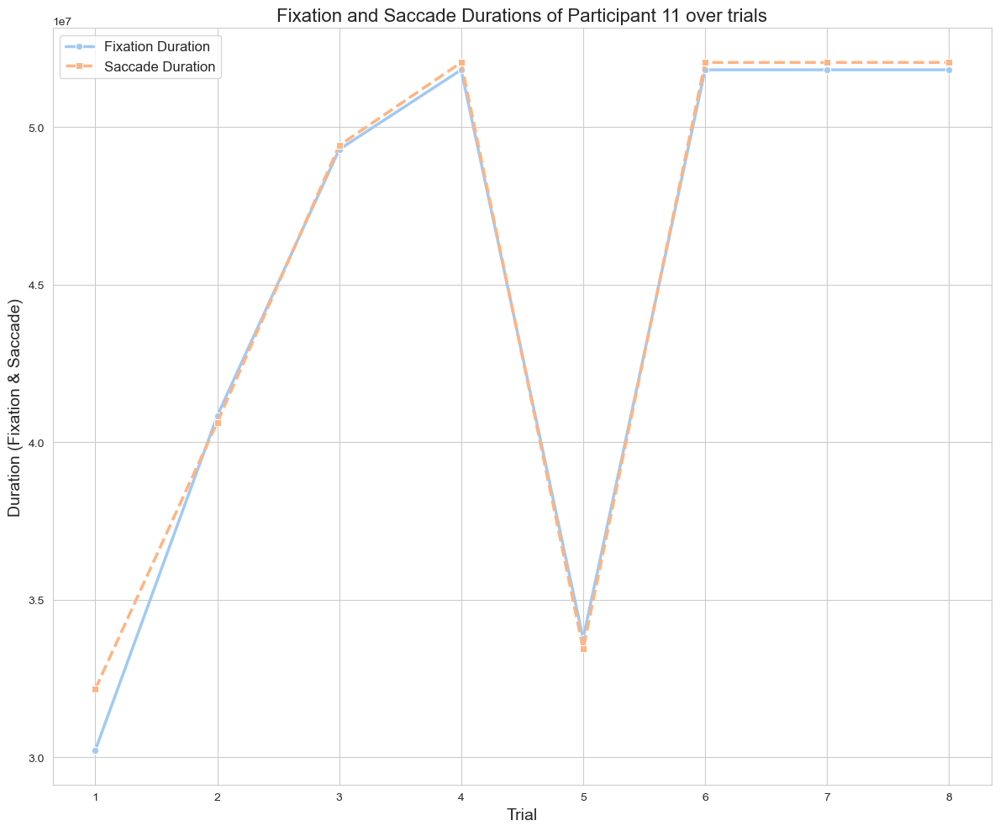

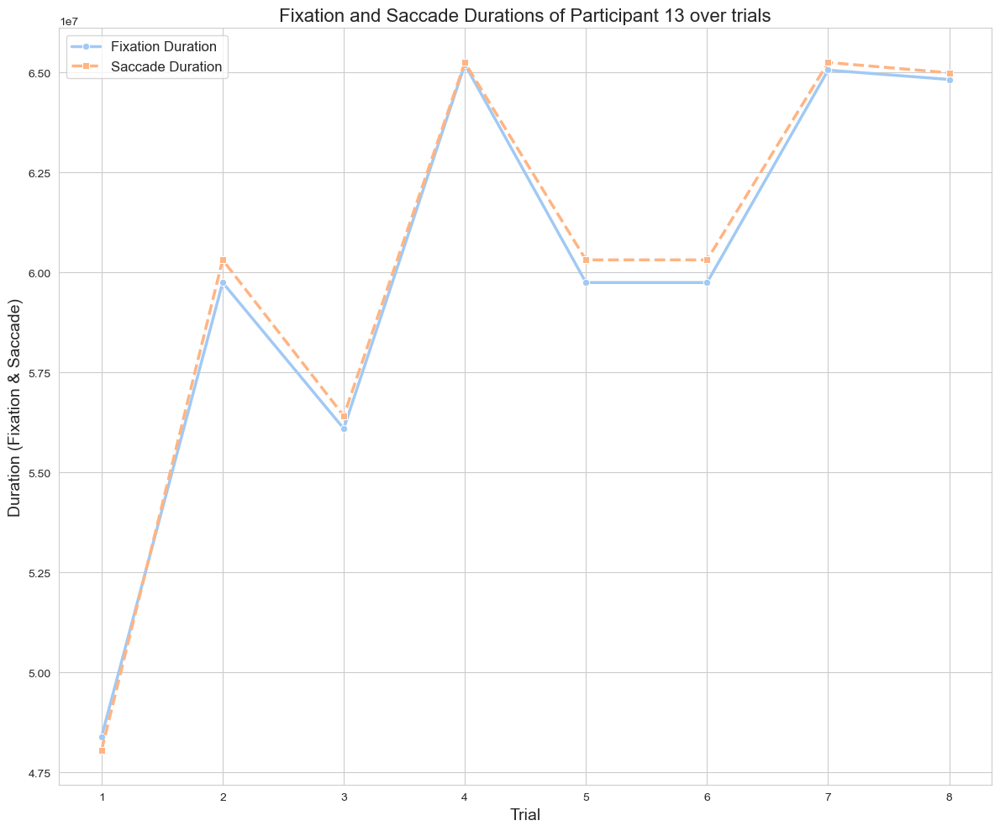

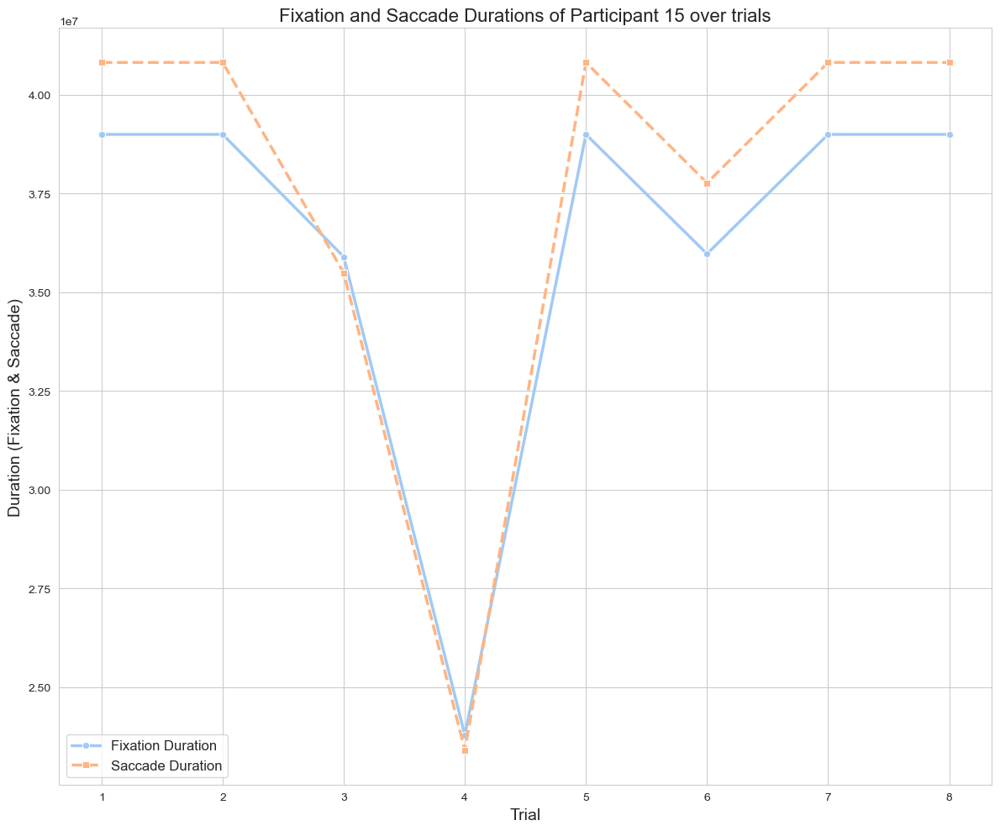

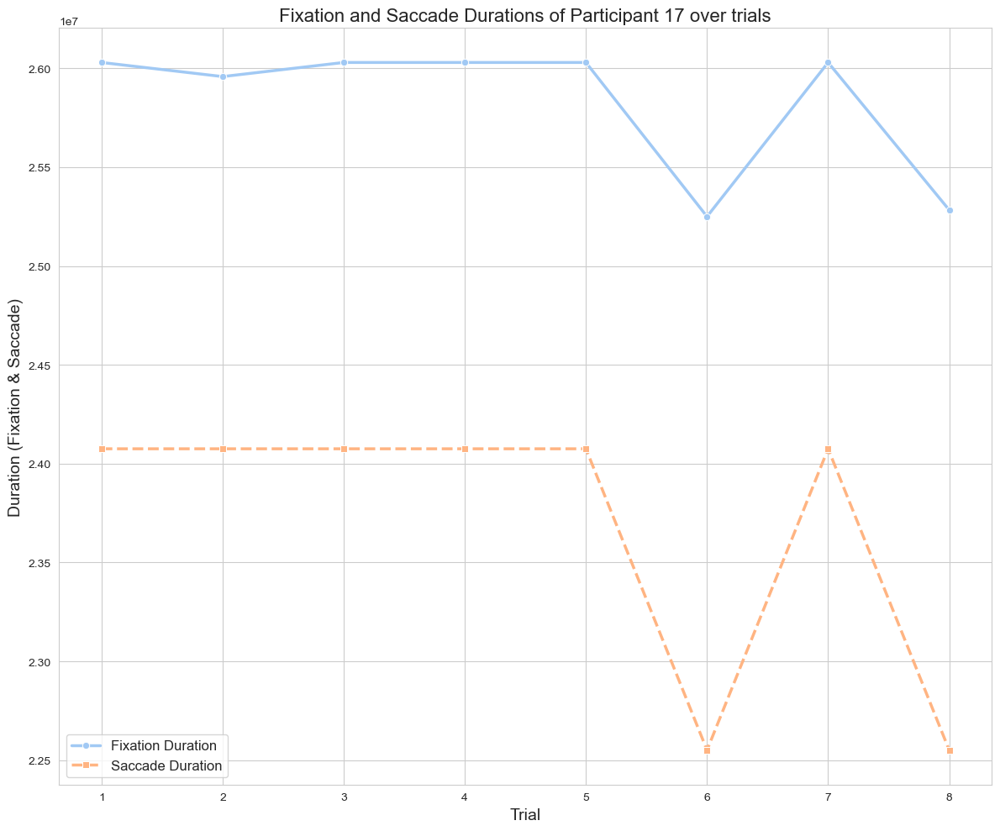

...

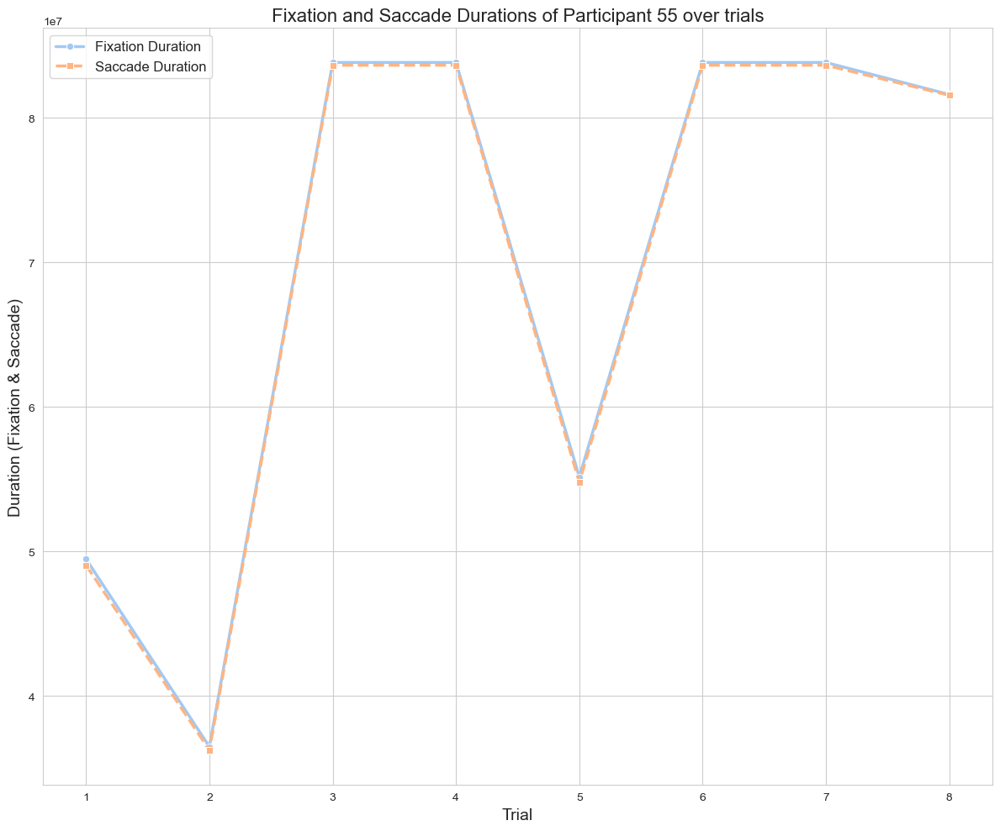

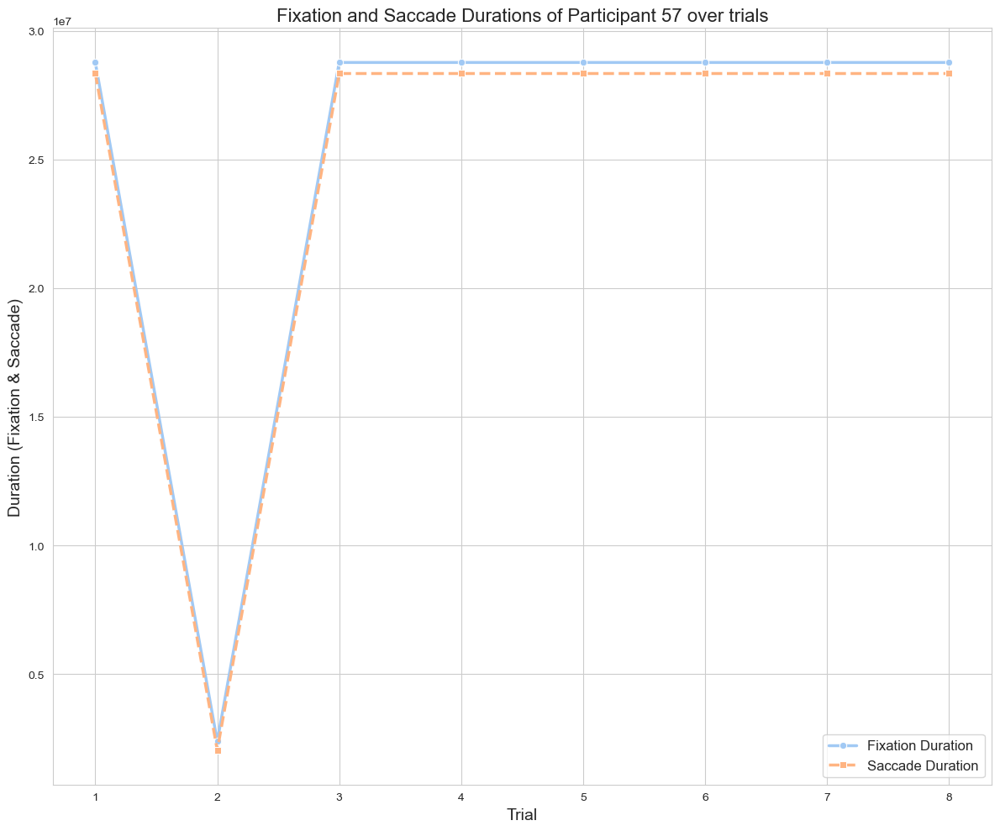

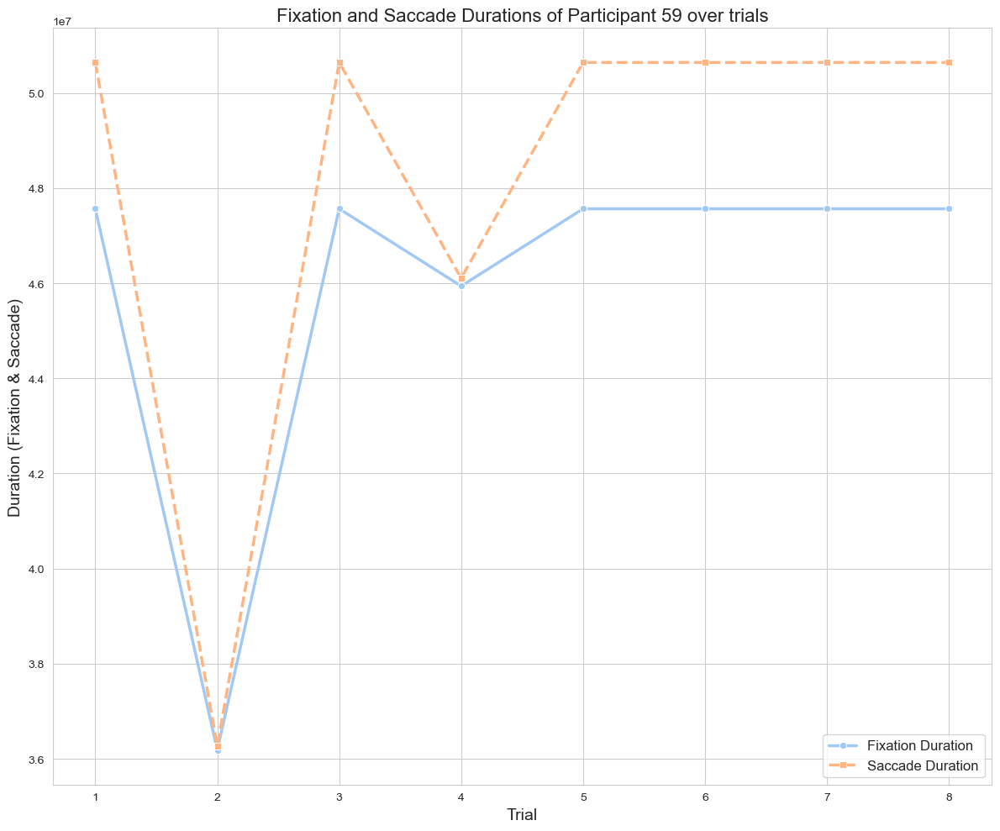

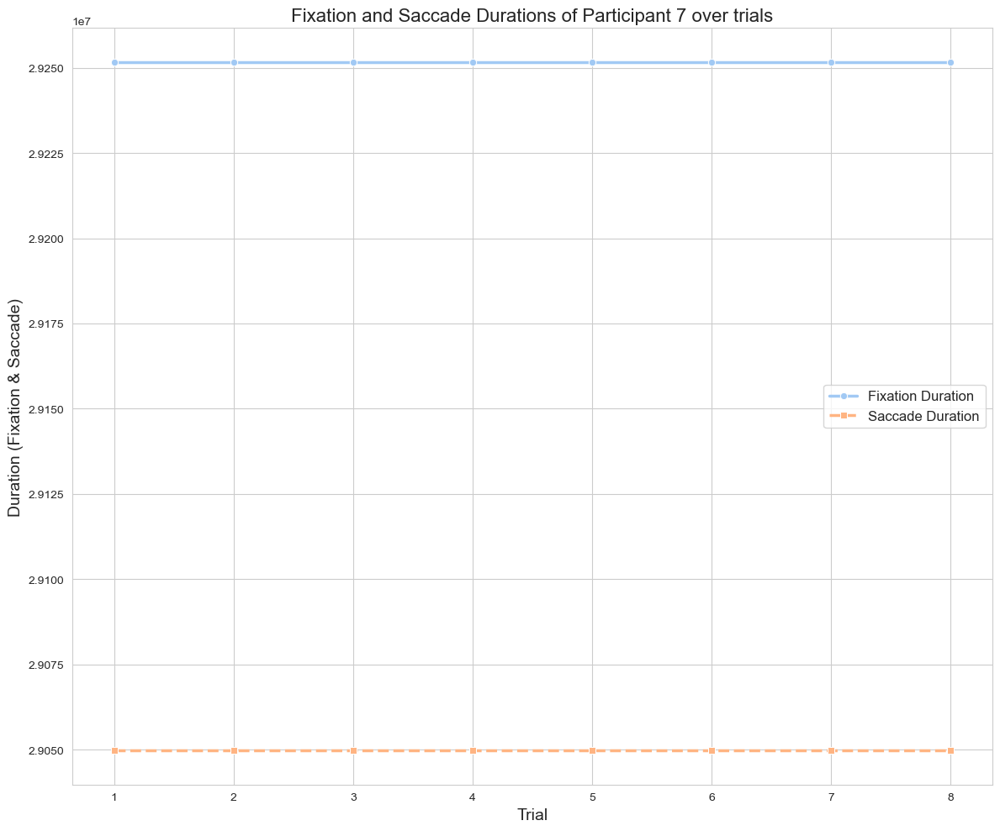

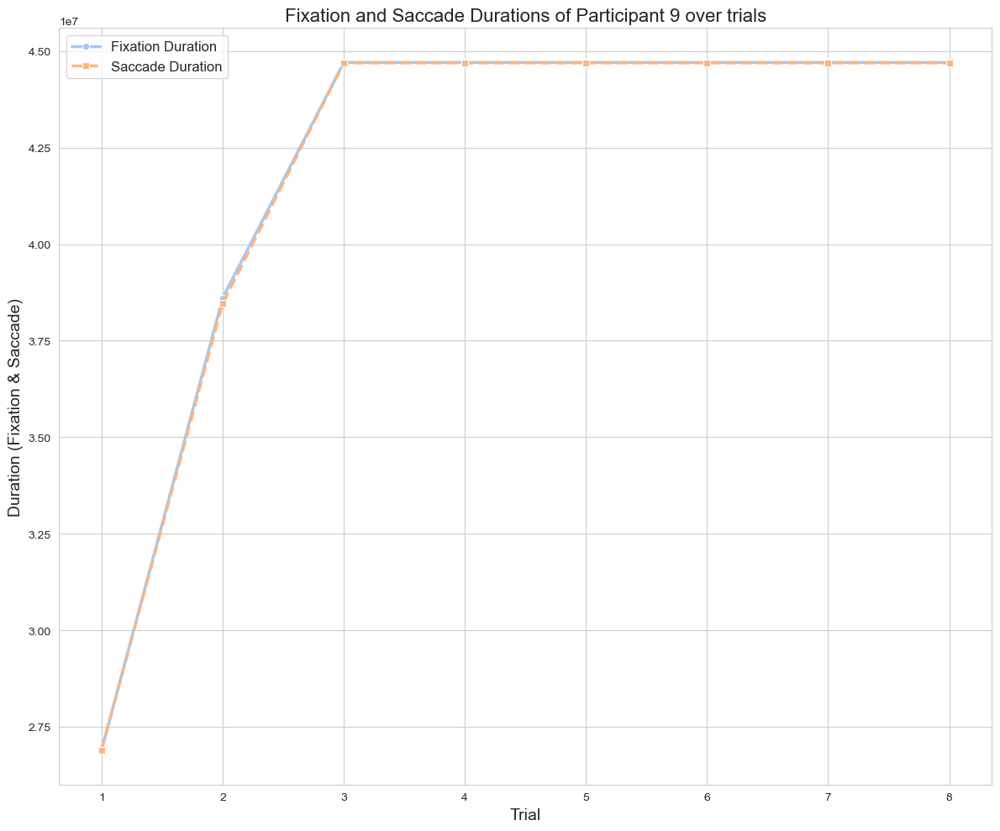

In [87]:
# Iterate over participant groups and plot the Eye movement type
for participant_name, participant_data in test_results_optimized.groupby('Participant'):
    plot_fixation_saccade_durations(participant_data,participant_name)

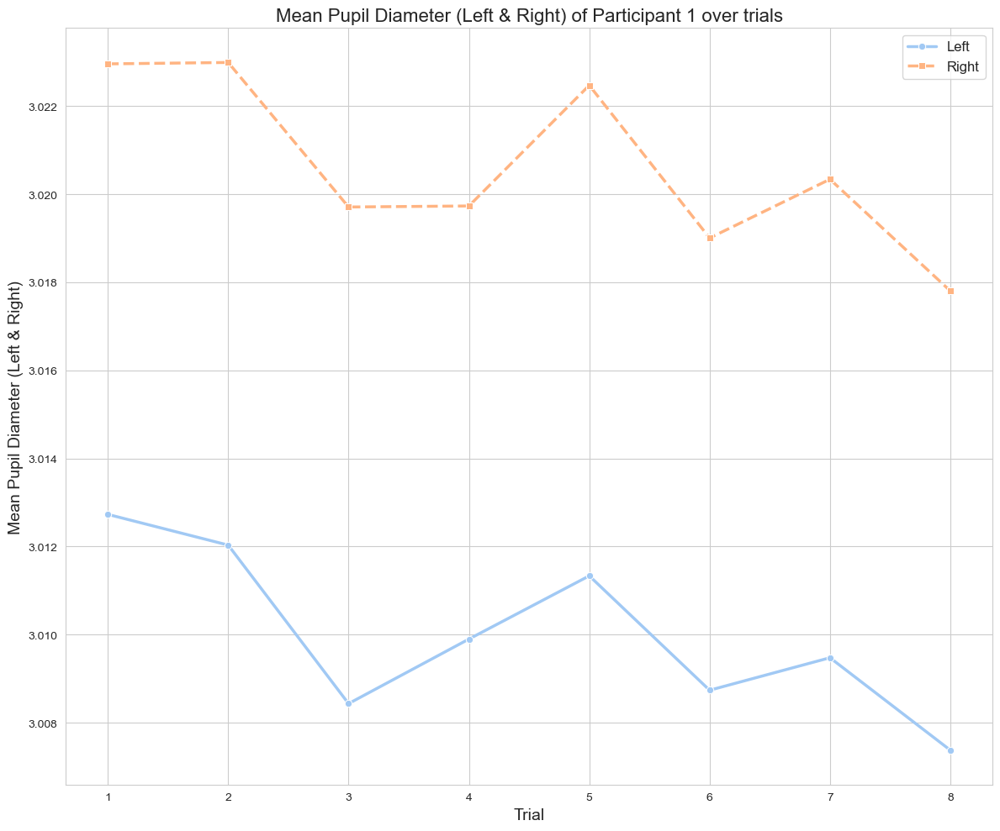

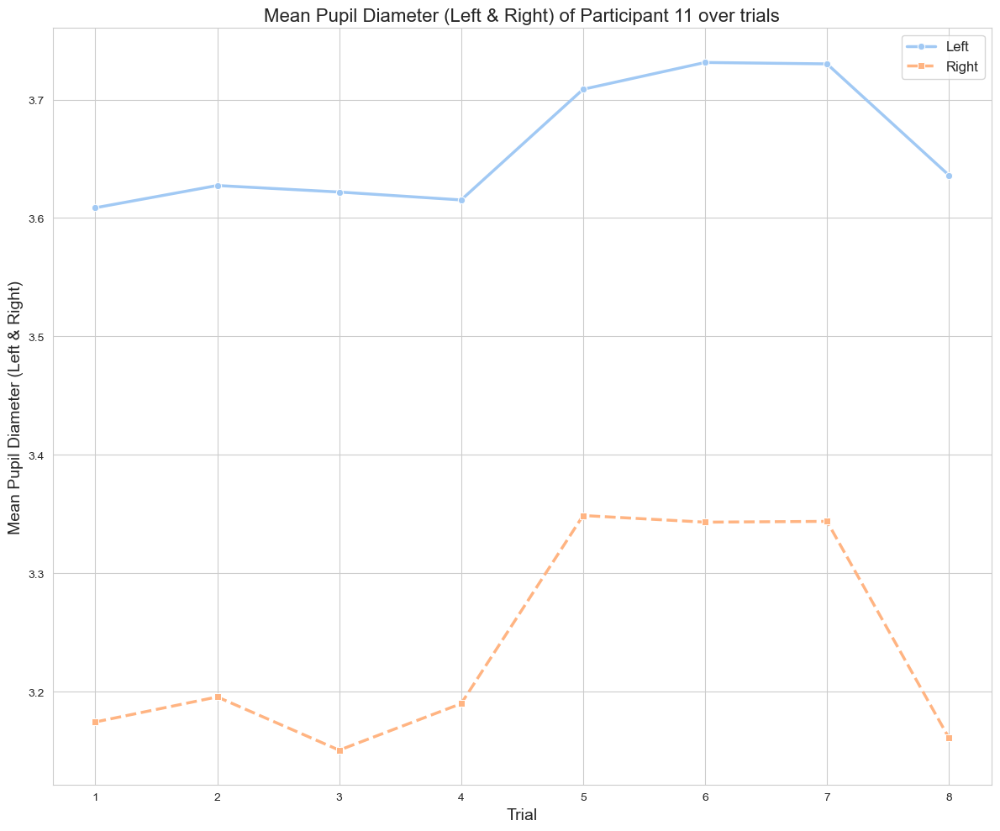

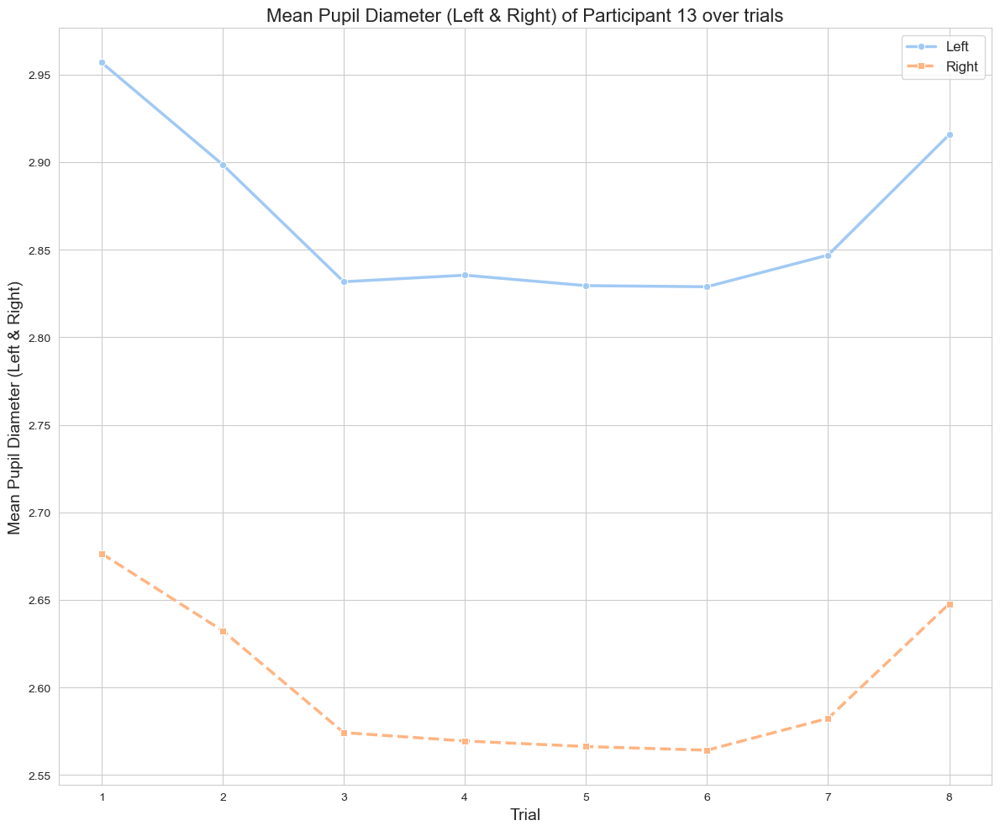

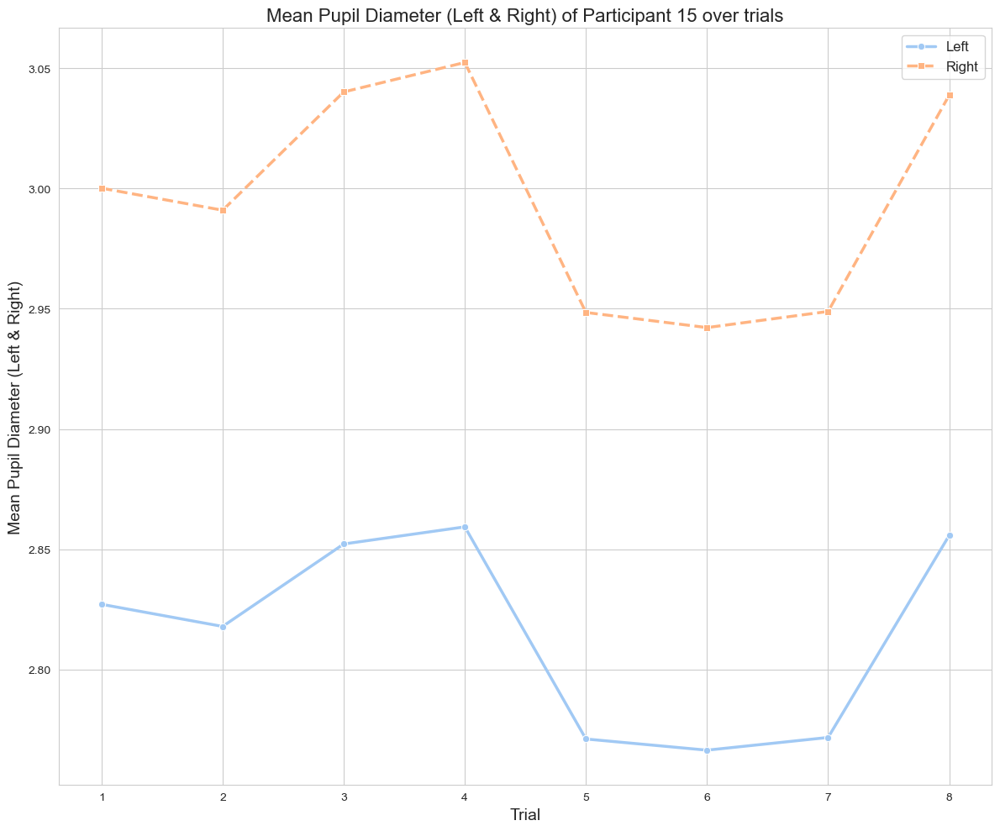

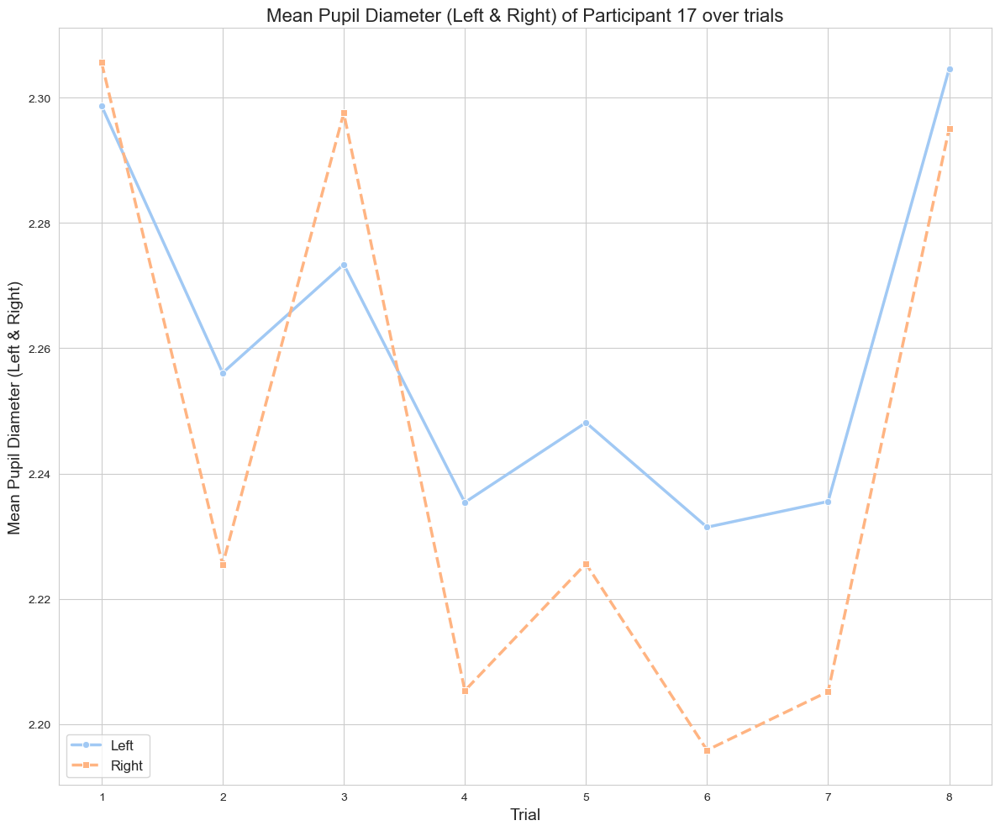

...

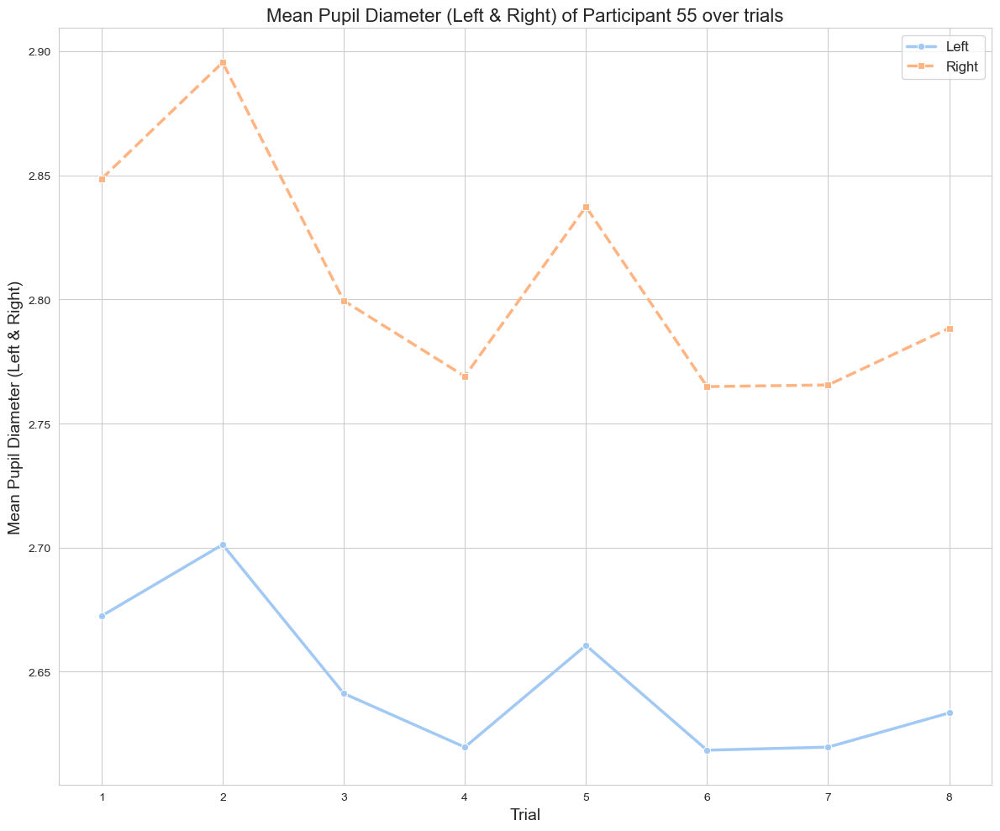

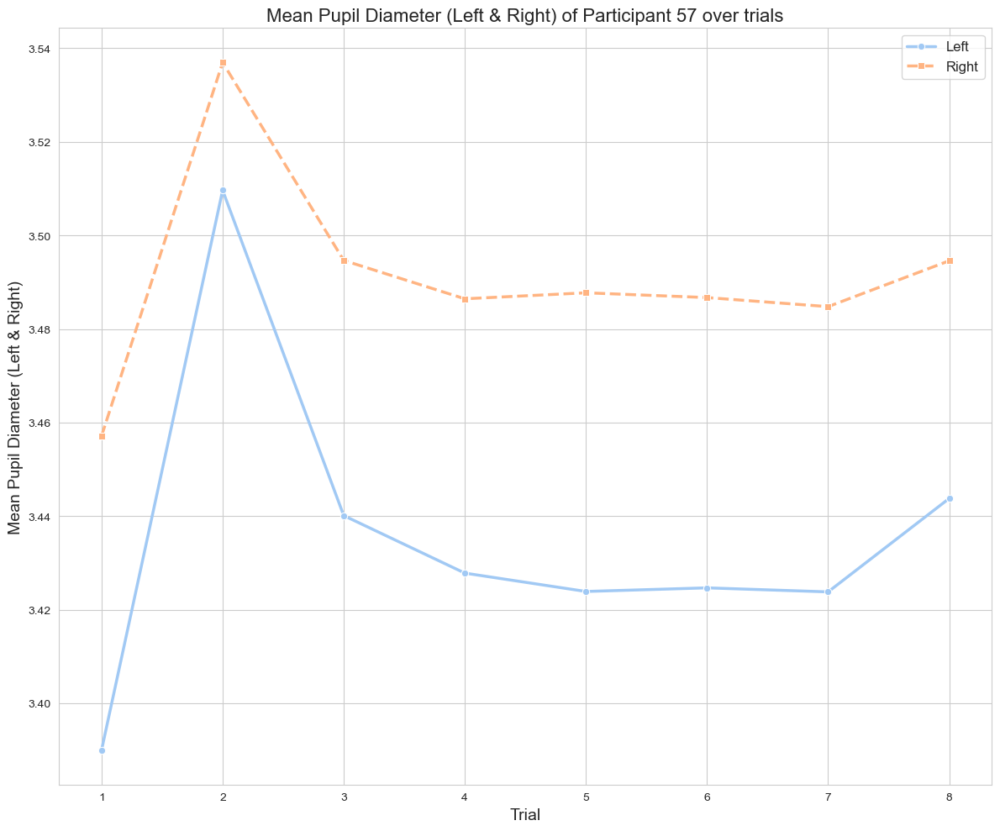

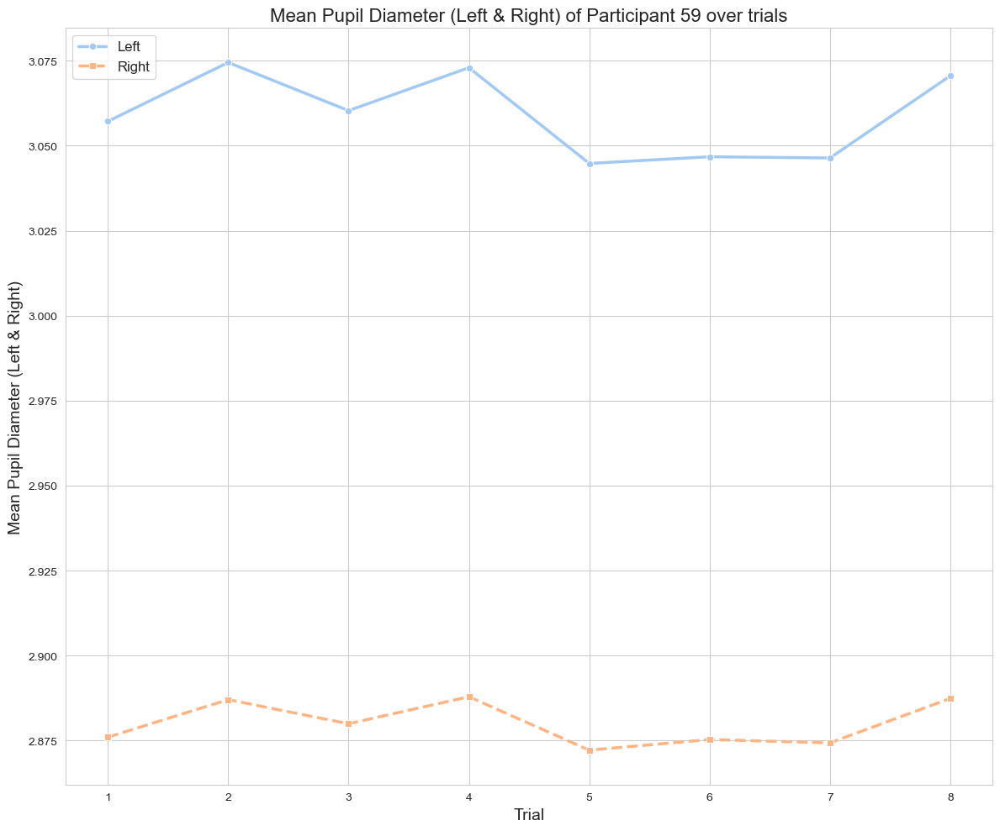

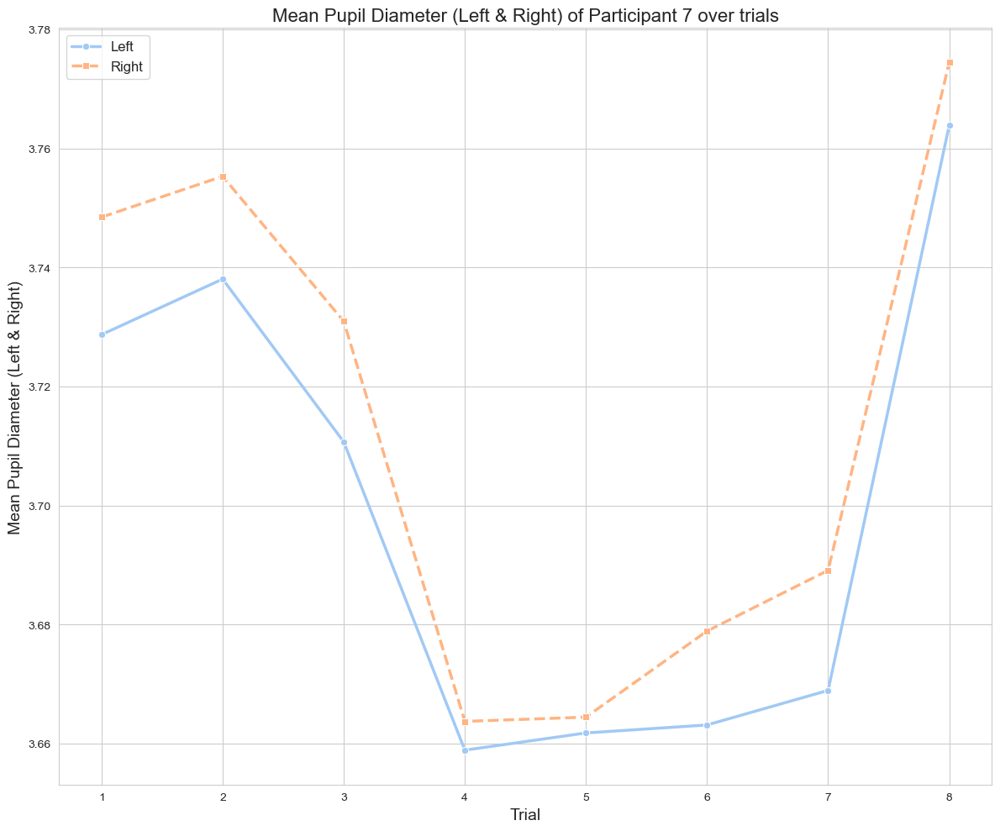

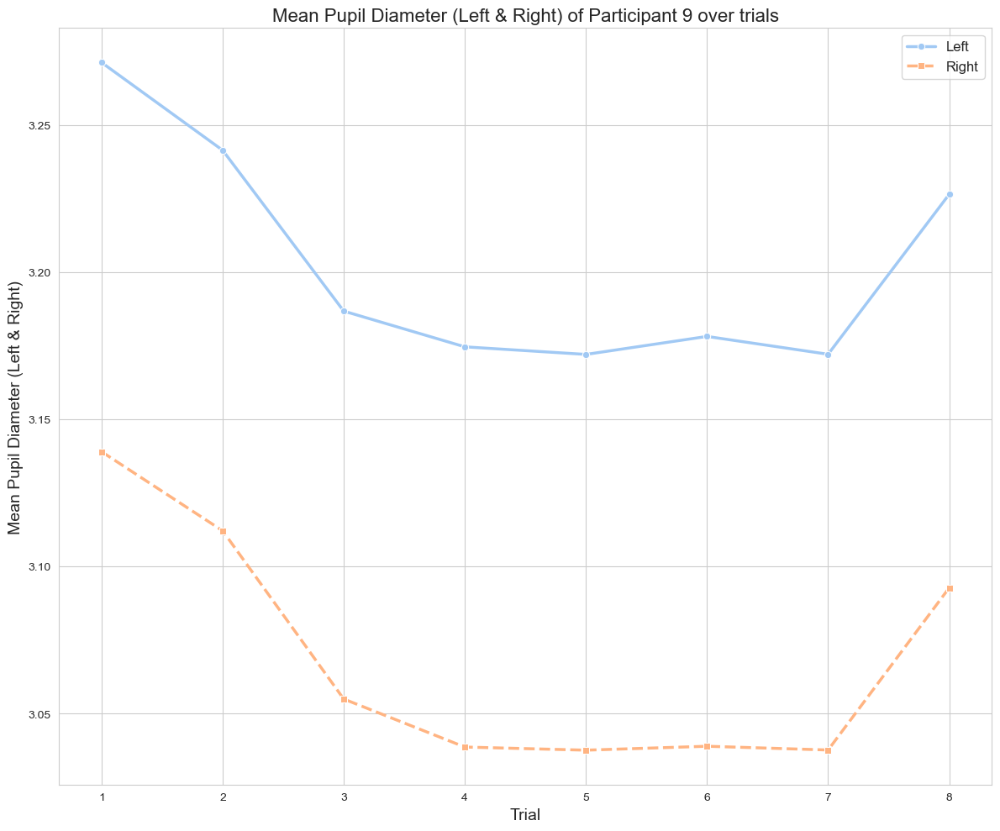

In [88]:
# Iterate over participant groups and plot the pupil diameter data
for participant_name, participant_data in test_results_optimized.groupby('Participant'):
    plot_pupil_diameter(participant_data, participant_name)

In [89]:
questionaaire_score.head()

,Participant nr,Score_before,Score_after,Average Score
0,1,134,137,135.5
1,2,133,127,130.0
2,3,116,123,119.5
3,4,114,120,117.0
4,5,138,124,131.0


In [90]:
test_results_optimized.head()

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,1,1,3.012729,3.022959,17384828.0,18661218.0
1,1,2,3.012032,3.022991,17384828.0,18661218.0
2,1,3,3.008432,3.019709,17384828.0,18661218.0
3,1,4,3.009897,3.019732,17384828.0,18661218.0
4,1,5,3.011333,3.022471,17384828.0,18661218.0


In [91]:
# Merge the dataframes on the participant number columns
test_DataWithScore_df = pd.merge(test_results_optimized, questionaaire_score[['Average Score', 'Participant nr']], left_on='Participant', right_on='Participant nr', how='inner')
test_DataWithScore_df.head()

,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration,Average Score,Participant nr
0,1,1,3.012729,3.022959,17384828.0,18661218.0,135.5,1
1,1,2,3.012032,3.022991,17384828.0,18661218.0,135.5,1
2,1,3,3.008432,3.019709,17384828.0,18661218.0,135.5,1
3,1,4,3.009897,3.019732,17384828.0,18661218.0,135.5,1
4,1,5,3.011333,3.022471,17384828.0,18661218.0,135.5,1


In [92]:
# Assuming your dataframe is named df
test_DataWithScore_df.to_csv('test_DataWithScore_df.csv', index=False)

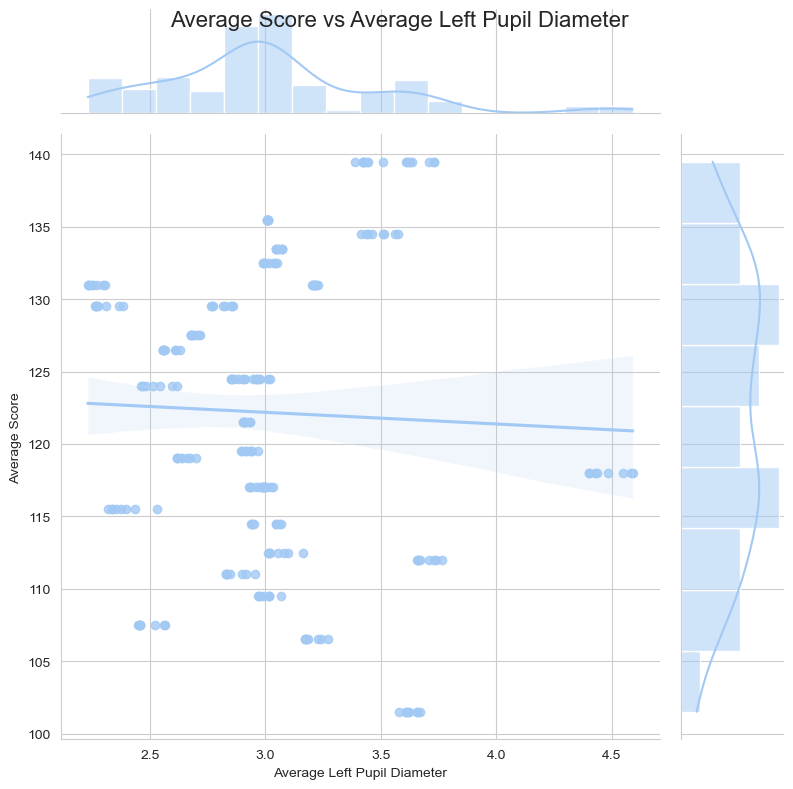

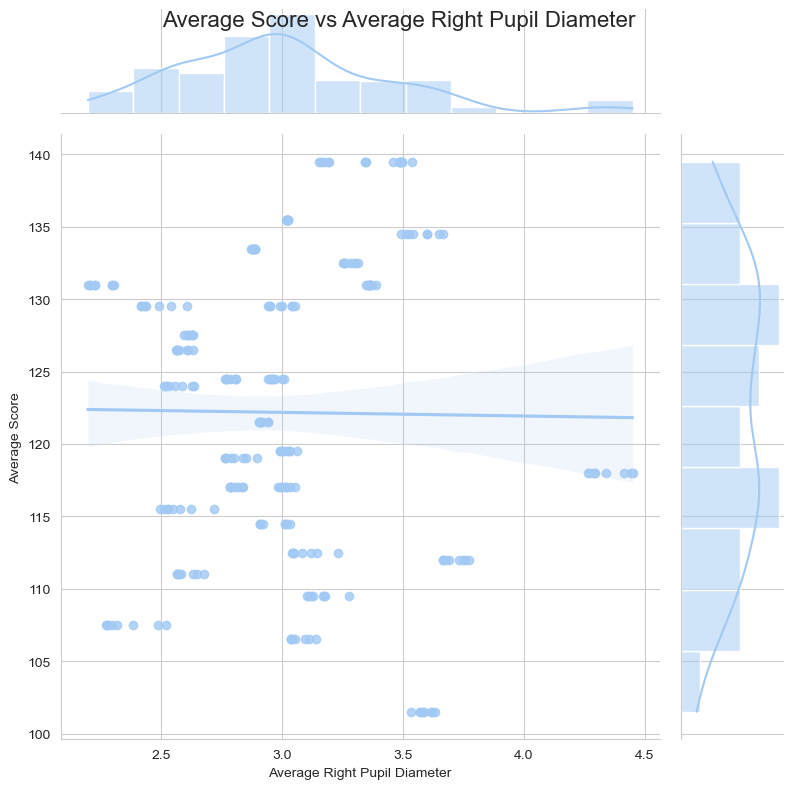

In [93]:
# Joint plots with regression lines
g_left_test = sns.jointplot(data=test_DataWithScore_df, x='Average Left Pupil Diameter', y='Average Score', kind='reg', height=8)
g_left_test.fig.suptitle('Average Score vs Average Left Pupil Diameter', fontsize=16)
g_right_test = sns.jointplot(data=test_DataWithScore_df, x='Average Right Pupil Diameter', y='Average Score', kind='reg', height=8)
g_right_test.fig.suptitle('Average Score vs Average Right Pupil Diameter', fontsize=16)
plt.show()

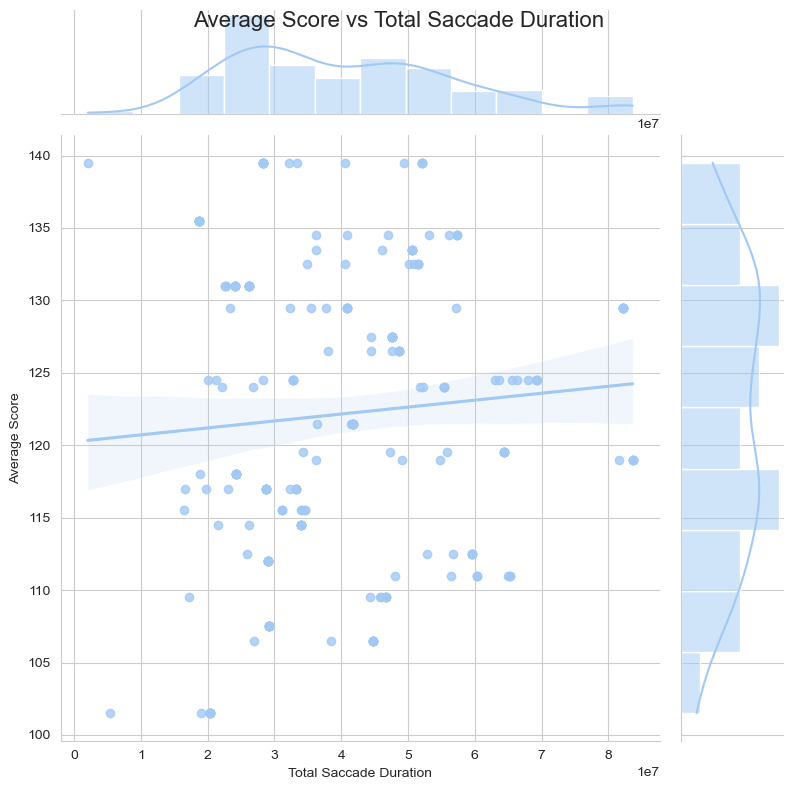

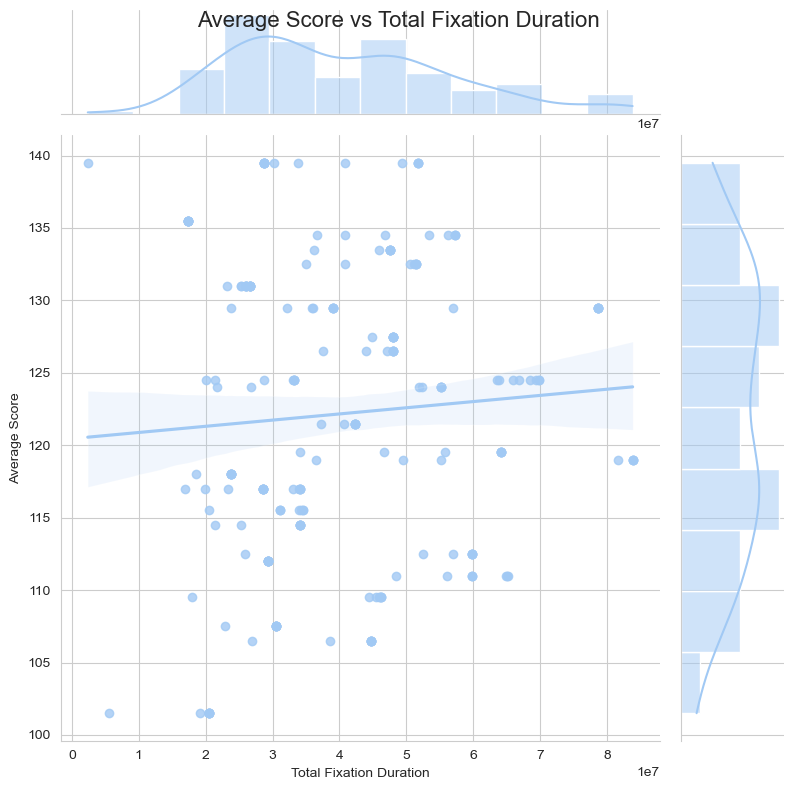

In [94]:
# Joint plots with regression lines for Saccade Duration
g_saccade_test = sns.jointplot(data=test_DataWithScore_df, x='Total Saccade Duration', y='Average Score', kind='reg', height=8)
g_saccade_test.fig.suptitle('Average Score vs Total Saccade Duration', fontsize=16)

# Joint plots with regression lines for Fixation Duration
g_fixation_test = sns.jointplot(data=test_DataWithScore_df, x='Total Fixation Duration', y='Average Score', kind='reg', height=8)
g_fixation_test.fig.suptitle('Average Score vs Total Fixation Duration', fontsize=16)

plt.show()

In [95]:
# Save plots for Saccade and Fixation Duration
g_saccade_test.savefig("g_saccade_test_plot.png")
g_fixation_test.savefig("g_fixation_test_plot.png")

# Save plots for Pupil Diameter
g_left_test.savefig("g_left_test_plot.png")
g_right_test.savefig("g_right_test_plot.png")

In [96]:
# Drop the redundant 'Participant nr' column
test_DataWithScore_df = test_DataWithScore_df.drop(columns=['Participant nr'])
test_DataWithScore_df.head()


,Participant,Trial,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration,Average Score
0,1,1,3.012729,3.022959,17384828.0,18661218.0,135.5
1,1,2,3.012032,3.022991,17384828.0,18661218.0,135.5
2,1,3,3.008432,3.019709,17384828.0,18661218.0,135.5
3,1,4,3.009897,3.019732,17384828.0,18661218.0,135.5
4,1,5,3.011333,3.022471,17384828.0,18661218.0,135.5


In [97]:
standardized_test_dataframe=standardize_columns(test_DataWithScore_df, variables_to_standardize)

In [98]:
standardized_test_dataframe.head()

,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,0.014880,0.045717,-1.416463,-1.319369
1,0.013379,0.045789,-1.416463,-1.319369
2,0.005626,0.038371,-1.416463,-1.319369
3,0.008782,0.038424,-1.416463,-1.319369
4,0.011874,0.044615,-1.416463,-1.319369


In [99]:

resultant_test_dataframe = test_DataWithScore_df.drop(columns=variables_to_standardize)
resultant_test_dataframe = pd.concat([resultant_test_dataframe, standardized_test_dataframe], axis=1)


In [100]:
resultant_test_dataframe.head()

,Participant,Trial,Average Score,Average Left Pupil Diameter,Average Right Pupil Diameter,Total Fixation Duration,Total Saccade Duration
0,1,1,135.5,0.014880,0.045717,-1.416463,-1.319369
1,1,2,135.5,0.013379,0.045789,-1.416463,-1.319369
2,1,3,135.5,0.005626,0.038371,-1.416463,-1.319369
3,1,4,135.5,0.008782,0.038424,-1.416463,-1.319369
4,1,5,135.5,0.011874,0.044615,-1.416463,-1.319369


In [101]:
# Splitting the data for the current participant
X = resultant_test_dataframe.drop(['Average Score', 'Participant','Trial'], axis=1)
y = resultant_test_dataframe['Average Score']

In [102]:
X_train, y_train, X_test, y_test = split_data_using_groups(resultant_test_dataframe)

In [103]:
lasso_test_rmse, lasso_test_r2 = apply_lasso_cv(X_train, y_train, X_test, y_test)
print(f"LASSO - RMSE: {lasso_test_rmse:.2f}, R^2 Score: {lasso_test_r2:.2f}")

LASSO - RMSE: 10.93, R^2 Score: -0.02


In [104]:
# Models
models = [lasso_cv, rf, linear_reg]
model_names = ['LassoCV', 'Random Forest', 'Linear Regression']

# Lists to store results
r2_scores = []
rmse_scores = []

# Calculate scores for each model
for model in models:
    mean_r2, mean_rmse = group_cross_val_scores(model, X, y, groups=resultant_test_dataframe['Participant'])
    r2_scores.append(mean_r2)
    rmse_scores.append(mean_rmse)

# Create a DataFrame to store the results
results_test_df = pd.DataFrame({
    'Model': model_names,
    'Mean R^2': r2_scores,
    'Mean RMSE': rmse_scores
})

# Display the results in a table format
print(results_test_df)

               Model  Mean R^2  Mean RMSE
0            LassoCV -0.021421  10.933511
1      Random Forest -1.255157  16.245974
2  Linear Regression -0.273116  12.206508


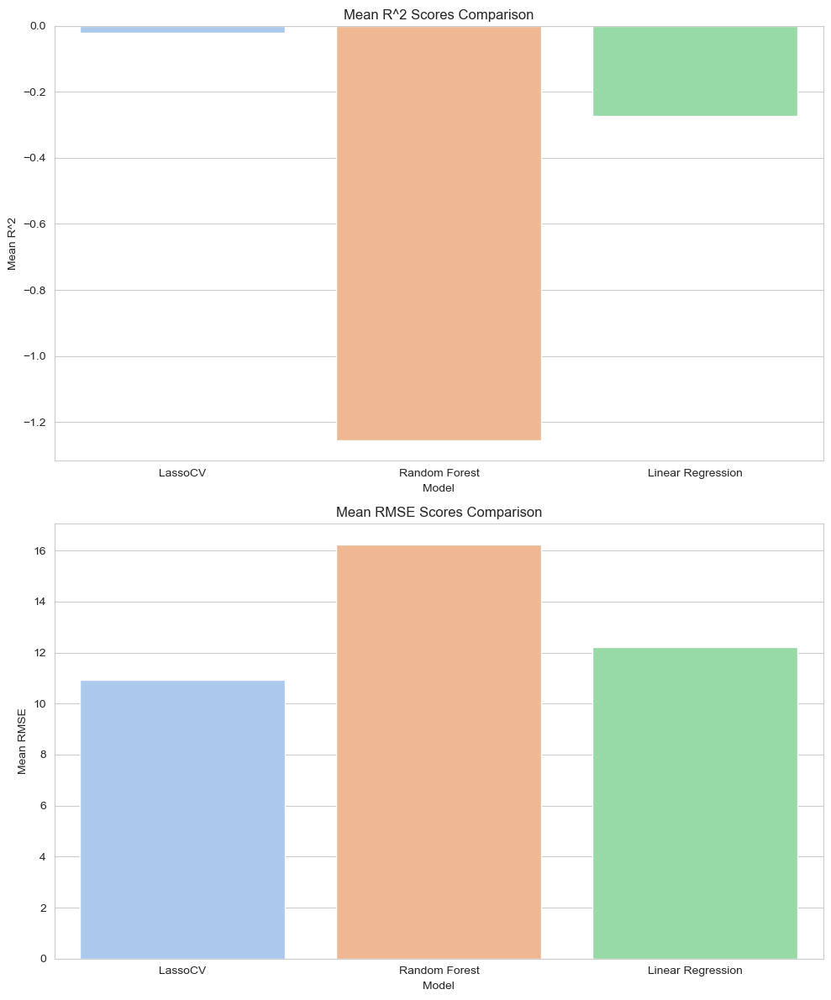

In [105]:
# Set up the figure and axes
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

# R^2 scores bar plot
sns.barplot(x='Model', y='Mean R^2', data=results_test_df, ax=ax[0])
ax[0].set_title('Mean R^2 Scores Comparison')

# RMSE scores bar plot
sns.barplot(x='Model', y='Mean RMSE', data=results_test_df, ax=ax[1])
ax[1].set_title('Mean RMSE Scores Comparison')

plt.tight_layout()
plt.show()

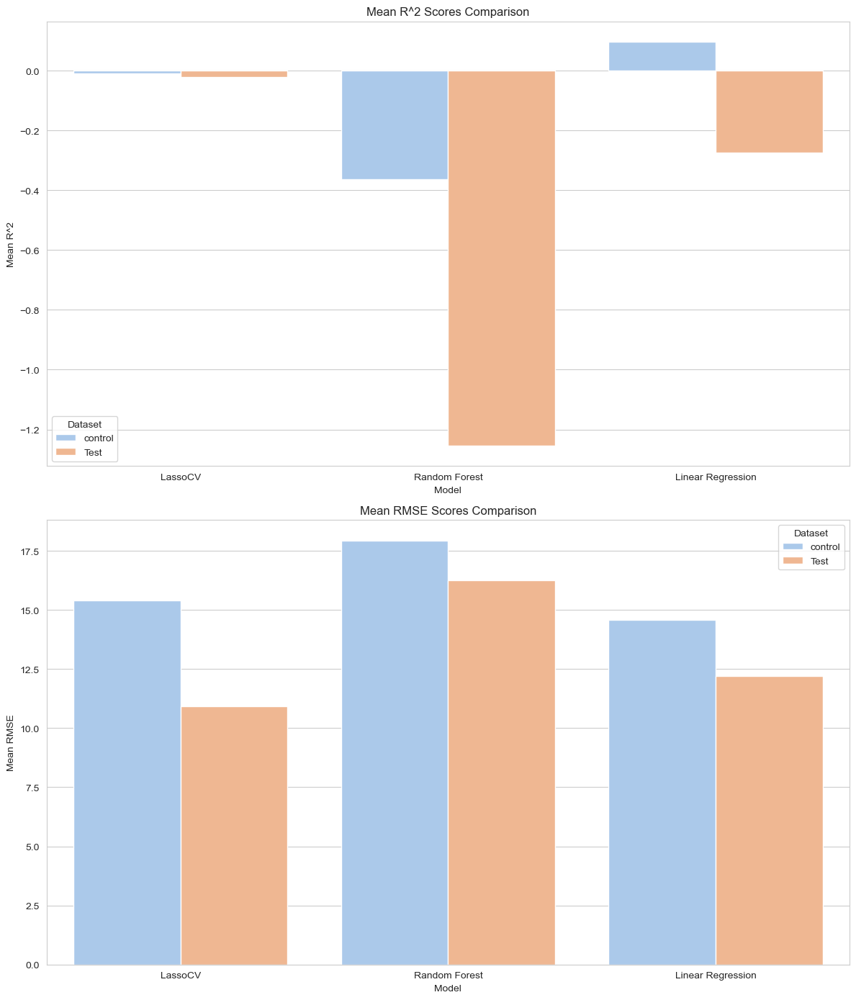

In [106]:
# Add a 'Dataset' column to each DataFrame
results_df['Dataset'] = 'control'
results_test_df['Dataset'] = 'Test'

# Concatenate the two DataFrames
combined_results = pd.concat([results_df, results_test_df])

# Plotting the comparison

# Set up the figure and axes
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 14))

# R^2 scores bar plot
sns.barplot(x='Model', y='Mean R^2', hue='Dataset', data=combined_results, ax=ax[0])
ax[0].set_title('Mean R^2 Scores Comparison')
ax[0].set_ylabel('Mean R^2')
ax[0].legend(title='Dataset')

# RMSE scores bar plot
sns.barplot(x='Model', y='Mean RMSE', hue='Dataset', data=combined_results, ax=ax[1])
ax[1].set_title('Mean RMSE Scores Comparison')
ax[1].set_ylabel('Mean RMSE')
ax[1].legend(title='Dataset')

plt.tight_layout()
plt.show()

In [107]:
plt.savefig("model_performace.png", dpi=300, bbox_inches='tight')



<Figure size 640x480 with 0 Axes>